# Read in csv for route 4

In [1]:
#Read into a dataframe a CSV dataset
#Timestamp micro since 1970 01 01 00:00:00 GMT'
#Line ID
#Direction
#Journey Pattern ID
#Time Frame (The start date of the production time table - in Dublin the production time table starts at 6am and ends at 3am)
#Vehicle Journey ID (A given run on the journey pattern)
#Operator (Bus operator, not the driver)
#Congestion [0=no,1=yes]
#Lon WGS84'Lat WGS84'
#Delay (seconds, negative if bus is ahead of schedule)
#Block ID (a section ID of the journey pattern)
#Vehicle ID
#Stop ID
#At Stop [0=no,1=yes]

# the ultimate target feature: delay per stop

# Imports.
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import date, datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
%matplotlib inline
import statsmodels.formula.api as sm
from patsy import dmatrices
from sklearn.linear_model import LogisticRegression
from sklearn.cross_validation import train_test_split
from sklearn import metrics
from sklearn.cross_validation import cross_val_score
from sklearn.tree import export_graphviz
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeRegressor
%matplotlib inline

# Read csv file into a dataframe.
df = pd.read_csv('route4.csv')
df.head()

/home/ubuntu/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (14) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,Timestamp,LineID,Direction,Journey_Pattern_ID,Timeframe,Vehicle_Journey_ID,Operator,Congestion,Lon,Lat,Delay,Block_ID,Vehicle_ID,Stop_ID,At_Stop
0,8,1356998427000000,4.0,0,null,2012-12-31,4243,HN,0,-6.279000,53.416683,0,4001,43043,7226,0
1,20,1356998427000000,4.0,0,00041002,2012-12-31,4599,HN,0,-6.277317,53.415817,0,4012,43035,281,1
2,44,1356998485000000,4.0,0,null,2012-12-31,4243,HN,0,-6.279000,53.416683,0,4001,43043,7226,0
3,46,1356998485000000,4.0,0,00041002,2012-12-31,4599,HN,0,-6.277317,53.415817,0,4012,43035,281,1
4,67,1356998546000000,4.0,0,00041002,2012-12-31,4599,HN,0,-6.277317,53.415817,0,4012,43035,281,1


In [2]:
df.shape

(689030, 16)

# Remame confusing column headings

In [3]:
df = df.rename(columns={'Timeframe': 'Start_date'})

# Dropping duplicates

In [4]:
df=df.drop_duplicates(keep='first')
df.shape

(681530, 16)

In [5]:
#df.T.drop_duplicates().T
#df.shape

# Dropping constant columns

# Checking for constant columns - cardinality = 1

In [6]:
for column in df.columns:
    print(column + "," + str(len(df[column].unique())))

Unnamed: 0,563375
Timestamp,387316
LineID,1
Direction,1
Journey_Pattern_ID,7
Start_date,32
Vehicle_Journey_ID,596
Operator,4
Congestion,2
Lon,34662
Lat,28283
Delay,3876
Block_ID,42
Vehicle_ID,116
Stop_ID,242
At_Stop,2


Direction is a constant - that is unexpected
Line is constant as we filtered for line

In [7]:
df = df.drop('Direction', axis=1)
df = df.drop('Unnamed: 0', axis=1)

The direction is constant, the line ID is only constant due to a filter.

In [8]:
check_congestion=pd.crosstab(df.Congestion,df.Journey_Pattern_ID, margins=True)
check_congestion

Journey_Pattern_ID,00040001,00040002,00041001,00041002,033X1001,null,All
Congestion,,,,,,,
0,305071,2919,306941,2613,9,60618,678171
1,3033,0,311,0,0,0,3344
All,308104,2919,307252,2613,9,60618,681515


In [9]:
#congestion accounts for .5% of the dataset - given most peak buses are late this is not a main driving feature
df = df.drop('Congestion', axis=1)

# Add new features

In [10]:
# Data time`

df["Time"] = pd.to_datetime(df['Timestamp']*1000, unit="ns")

In [11]:
#binary feature - weekend

df['IsWeekend'] = np.where((df['Time'].dt.dayofweek > 5), 1, 0)

In [12]:
#hour of day

df['HourOfDay'] = df['Time'].dt.hour

In [13]:
#binary feature - evening

df['IsEveningTime'] = np.where((df['Time'].dt.hour > 17), 1, 0)

In [14]:
#binary feature - peak hours

df['IsPeakTime'] = np.where(((df['HourOfDay'] >= 7) & (df['HourOfDay'] <= 10)) | ((df['HourOfDay'] >= 16) & (df['HourOfDay'] <= 19)), 1, 0)

In [15]:
#binary feature - school holiday

df['SchoolHoliday'] = np.where((df['Time'].dt.date == datetime(2012, 11, 1).date()) | (

df['Time'].dt.date == datetime(2012, 11, 2).date()) | (

                                       df['Time'].dt.date == datetime(2013, 1, 1).date()) | (

                                       df['Time'].dt.date == datetime(2013, 1, 2).date()) | (

                                       df['Time'].dt.date == datetime(2013, 1, 3).date()) | (

                                       df['Time'].dt.date == datetime(2013, 1, 4).date()), 1, 0)

In [16]:
df[(df.Journey_Pattern_ID=='00041001') & (df.Start_date == '2013-01-03') & (df.HourOfDay == 7) &(df.Vehicle_Journey_ID ==4572)]

,Timestamp,LineID,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,Stop_ID,At_Stop,Time,IsWeekend,HourOfDay,IsEveningTime,IsPeakTime,SchoolHoliday
45302,1357197248000000,4.0,00041001,2013-01-03,4572,HN,-6.153050,53.288715,0,4004,43048,7330,1,2013-01-03 07:14:08,0,7,0,1,1
45311,1357197268000000,4.0,00041001,2013-01-03,4572,HN,-6.151150,53.289482,0,4004,43048,7330,1,2013-01-03 07:14:28,0,7,0,1,1
45320,1357197287000000,4.0,00041001,2013-01-03,4572,HN,-6.152583,53.288868,0,4004,43048,7330,1,2013-01-03 07:14:47,0,7,0,1,1
45327,1357197295000000,4.0,00041001,2013-01-03,4572,HN,-6.152583,53.288868,0,4004,43048,7330,1,2013-01-03 07:14:55,0,7,0,1,1
45339,1357197328000000,4.0,00041001,2013-01-03,4572,HN,-6.154767,53.288151,0,4004,43048,7330,1,2013-01-03 07:15:28,0,7,0,1,1
45347,1357197349000000,4.0,00041001,2013-01-03,4572,HN,-6.153664,53.288544,43,4004,43048,7330,0,2013-01-03 07:15:49,0,7,0,1,1
45357,1357197367000000,4.0,00041001,2013-01-03,4572,HN,-6.159831,53.286541,-25,4004,43048,2051,1,2013-01-03 07:16:07,0,7,0,1,1
45366,1357197388000000,4.0,00041001,2013-01-03,4572,HN,-6.160781,53.286232,-25,4004,43048,2051,0,2013-01-03 07:16:28,0,7,0,1,1
45374,1357197409000000,4.0,00041001,2013-01-03,4572,HN,-6.161652,53.285721,-25,4004,43048,2051,0,2013-01-03 07:16:49,0,7,0,1,1
45382,1357197429000000,4.0,00041001,2013-01-03,4572,HN,-6.164366,53.286129,-25,4004,43048,2051,0,2013-01-03 07:17:09,0,7,0,1,1


# Merge bus stop info

In [17]:
df_bus_stop = pd.read_csv('busstopinfo.csv', encoding='latin-1')
df_bus_stop.head()

,stopid,displaystopid,shortname,fullname,latitude,longitude,lastupdated,OperatorName,route1,route2,...,route26,route27,route28,route29,route30,route31,route32,route33,route34,route35
0,2,2,Parnell Square,Parnell Square,53.352241,-6.263695,12/06/2017 08:09,bac,38,38A,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3,3,Parnell Square,Parnell Square,53.352307,-6.263783,12/06/2017 08:09,bac,120,122,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4,4,Parnell Square,Parnell Square,53.352567,-6.264166,12/06/2017 08:09,bac,7,7B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,6,6,Parnell Square,Parnell Square,53.352744,-6.264443,12/06/2017 08:09,bac,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7,7,Parnell Square,Parnell Square,53.352836,-6.264562,12/06/2017 08:09,bac,40,40B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
df_bus_stop_route4 = df_bus_stop.loc[(df_bus_stop.route1 == '4')]
df_bus_stop_route4.shape

(49, 43)

So there are 42 official Route 4 stops.

In [19]:
df_bus_stop_route4 = df_bus_stop_route4.rename(columns={'stopid': 'Stop_ID'})

Get southbound order of stops

In [20]:
df_northbound = df.loc[(df.Vehicle_ID == 43048) & (df.Vehicle_Journey_ID == 4572)]
df_northbound

,Timestamp,LineID,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,Stop_ID,At_Stop,Time,IsWeekend,HourOfDay,IsEveningTime,IsPeakTime,SchoolHoliday
45296,1357197233000000,4.0,null,2013-01-03,4572,HN,-6.153733,53.288517,0,4004,43048,7330,1,2013-01-03 07:13:53,0,7,0,1,1
45302,1357197248000000,4.0,00041001,2013-01-03,4572,HN,-6.153050,53.288715,0,4004,43048,7330,1,2013-01-03 07:14:08,0,7,0,1,1
45311,1357197268000000,4.0,00041001,2013-01-03,4572,HN,-6.151150,53.289482,0,4004,43048,7330,1,2013-01-03 07:14:28,0,7,0,1,1
45320,1357197287000000,4.0,00041001,2013-01-03,4572,HN,-6.152583,53.288868,0,4004,43048,7330,1,2013-01-03 07:14:47,0,7,0,1,1
45327,1357197295000000,4.0,00041001,2013-01-03,4572,HN,-6.152583,53.288868,0,4004,43048,7330,1,2013-01-03 07:14:55,0,7,0,1,1
45339,1357197328000000,4.0,00041001,2013-01-03,4572,HN,-6.154767,53.288151,0,4004,43048,7330,1,2013-01-03 07:15:28,0,7,0,1,1
45347,1357197349000000,4.0,00041001,2013-01-03,4572,HN,-6.153664,53.288544,43,4004,43048,7330,0,2013-01-03 07:15:49,0,7,0,1,1
45357,1357197367000000,4.0,00041001,2013-01-03,4572,HN,-6.159831,53.286541,-25,4004,43048,2051,1,2013-01-03 07:16:07,0,7,0,1,1
45366,1357197388000000,4.0,00041001,2013-01-03,4572,HN,-6.160781,53.286232,-25,4004,43048,2051,0,2013-01-03 07:16:28,0,7,0,1,1
45374,1357197409000000,4.0,00041001,2013-01-03,4572,HN,-6.161652,53.285721,-25,4004,43048,2051,0,2013-01-03 07:16:49,0,7,0,1,1


In [21]:
df_southbound = df.loc[(df.Vehicle_ID == 43042) & (df.Vehicle_Journey_ID == 4915) & (df.Start_date == '2013-01-31') & (df.At_Stop == 1)]
df_southbound.head()

,Timestamp,LineID,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,Stop_ID,At_Stop,Time,IsWeekend,HourOfDay,IsEveningTime,IsPeakTime,SchoolHoliday
681251,1359617692000000,4.0,00040001,2013-01-31,4915,HN,-6.264970,53.402534,-10,4010,43042,7113,1,2013-01-31 07:34:52,0,7,0,1,0
681260,1359617712000000,4.0,00040001,2013-01-31,4915,HN,-6.264970,53.402534,9,4010,43042,7113,1,2013-01-31 07:35:12,0,7,0,1,0
681317,1359617830000000,4.0,00040001,2013-01-31,4915,HN,-6.263812,53.399124,-50,4010,43042,127,1,2013-01-31 07:37:10,0,7,0,1,0
681348,1359617893000000,4.0,00040001,2013-01-31,4915,HN,-6.264059,53.396149,-85,4010,43042,112,1,2013-01-31 07:38:13,0,7,0,1,0
681356,1359617910000000,4.0,00040001,2013-01-31,4915,HN,-6.264059,53.396149,-64,4010,43042,112,1,2013-01-31 07:38:30,0,7,0,1,0


In [22]:
df_bus_stop_route4 = df_bus_stop_route4[['Stop_ID', 'fullname']]
df_bus_stop_route4.columns

Index(['Stop_ID', 'fullname'], dtype='object')

In [24]:
df_south = df_southbound.drop_duplicates(subset='Stop_ID', keep='first')

In [25]:
df_south['stop_order'] = df_south.groupby(['Vehicle_Journey_ID', 'At_Stop', 'Start_date', 'Vehicle_ID'])['Timestamp','Stop_ID'].cumcount().reindex()
df_south

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,Timestamp,LineID,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,Stop_ID,At_Stop,Time,IsWeekend,HourOfDay,IsEveningTime,IsPeakTime,SchoolHoliday,stop_order
681251,1359617692000000,4.0,00040001,2013-01-31,4915,HN,-6.264970,53.402534,-10,4010,43042,7113,1,2013-01-31 07:34:52,0,7,0,1,0,0
681317,1359617830000000,4.0,00040001,2013-01-31,4915,HN,-6.263812,53.399124,-50,4010,43042,127,1,2013-01-31 07:37:10,0,7,0,1,0,1
681348,1359617893000000,4.0,00040001,2013-01-31,4915,HN,-6.264059,53.396149,-85,4010,43042,112,1,2013-01-31 07:38:13,0,7,0,1,0,2
681412,1359618013000000,4.0,00040001,2013-01-31,4915,HN,-6.263807,53.392265,-88,4010,43042,113,1,2013-01-31 07:40:13,0,7,0,1,0,3
681480,1359618152000000,4.0,00040001,2013-01-31,4915,HN,-6.265003,53.385361,-182,4010,43042,37,1,2013-01-31 07:42:32,0,7,0,1,0,4
681510,1359618214000000,4.0,00040001,2013-01-31,4915,HN,-6.265583,53.382252,-211,4010,43042,38,1,2013-01-31 07:43:34,0,7,0,1,0,5
681573,1359618332000000,4.0,00040001,2013-01-31,4915,HN,-6.264807,53.376633,-298,4010,43042,40,1,2013-01-31 07:45:32,0,7,0,1,0,6
681612,1359618412000000,4.0,00040001,2013-01-31,4915,HN,-6.265924,53.372498,-409,4010,43042,147,1,2013-01-31 07:46:52,0,7,0,1,0,7
681820,1359618830000000,4.0,00040001,2013-01-31,4915,HN,-6.269024,53.369736,-141,4010,43042,184,1,2013-01-31 07:53:50,0,7,0,1,0,8
681934,1359619051000000,4.0,00040001,2013-01-31,4915,HN,-6.271678,53.365372,-152,4010,43042,186,1,2013-01-31 07:57:31,0,7,0,1,0,9


In [28]:
df_north =df_northbound.drop_duplicates(subset='Stop_ID', keep='first')

In [29]:
df_north['stop_order'] = df_north.groupby(['Vehicle_Journey_ID', 'At_Stop', 'Start_date', 'Vehicle_ID'])['Timestamp','Stop_ID'].cumcount().reindex()
df_north

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,Timestamp,LineID,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,Stop_ID,At_Stop,Time,IsWeekend,HourOfDay,IsEveningTime,IsPeakTime,SchoolHoliday,stop_order
45296,1357197233000000,4.0,null,2013-01-03,4572,HN,-6.153733,53.288517,0,4004,43048,7330,1,2013-01-03 07:13:53,0,7,0,1,1,0
45357,1357197367000000,4.0,00041001,2013-01-03,4572,HN,-6.159831,53.286541,-25,4004,43048,2051,1,2013-01-03 07:16:07,0,7,0,1,1,1
45392,1357197447000000,4.0,00041001,2013-01-03,4572,HN,-6.165994,53.286362,-25,4004,43048,6086,1,2013-01-03 07:17:27,0,7,0,1,1,2
45416,1357197507000000,4.0,00041001,2013-01-03,4572,HN,-6.167912,53.287037,-25,4004,43048,3161,1,2013-01-03 07:18:27,0,7,0,1,1,3
45441,1357197568000000,4.0,00041001,2013-01-03,4572,HN,-6.167534,53.289749,-35,4004,43048,3162,1,2013-01-03 07:19:28,0,7,0,1,1,4
45458,1357197607000000,4.0,00041001,2013-01-03,4572,HN,-6.166771,53.292568,-114,4004,43048,3163,1,2013-01-03 07:20:07,0,7,0,1,1,5
45496,1357197687000000,4.0,00041001,2013-01-03,4572,HN,-6.169960,53.296001,-185,4004,43048,3164,0,2013-01-03 07:21:27,0,7,0,1,1,0
45543,1357197787000000,4.0,00041001,2013-01-03,4572,HN,-6.181291,53.301643,-426,4004,43048,3084,0,2013-01-03 07:23:07,0,7,0,1,1,1
45561,1357197828000000,4.0,00041001,2013-01-03,4572,HN,-6.183967,53.302956,-443,4004,43048,469,1,2013-01-03 07:23:48,0,7,0,1,1,6
45589,1357197888000000,4.0,00041001,2013-01-03,4572,HN,-6.190981,53.306885,-553,4004,43048,470,0,2013-01-03 07:24:48,0,7,0,1,1,2


In [30]:
df_order = df_south[['Stop_ID', 'stop_order']]
df_order=df_order.drop_duplicates(subset='Stop_ID', keep='first')
df_order.head()

,Stop_ID,stop_order
681251,7113,0
681317,127,1
681348,112,2
681412,113,3
681480,37,4


In [31]:
df_order2 = df_north[['Stop_ID', 'stop_order']]
df_order2=df_order2.drop_duplicates(subset='Stop_ID', keep='first')
frames = [df_order, df_order2]
df_order3 = pd.concat(frames)

In [32]:
df_bus_stop_route4= pd.merge(df_order3, df_bus_stop_route4, on=['Stop_ID'])

df_bus_stop_route4.head()


,Stop_ID,stop_order,fullname
0,7113,0,Ballymun Road
1,127,1,Ballymun Road
2,113,3,Ballymun Road
3,147,7,Mobhi Road
4,273,14,O'Connell St


In [33]:
df_bus_stop_route4.columns


Index(['Stop_ID', 'stop_order', 'fullname'], dtype='object')

In [34]:
df = pd.merge(df, df_bus_stop_route4, on=['Stop_ID'])

df.head()

,Timestamp,LineID,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,...,Stop_ID,At_Stop,Time,IsWeekend,HourOfDay,IsEveningTime,IsPeakTime,SchoolHoliday,stop_order,fullname
0,1356998427000000,4.0,null,2012-12-31,4243,HN,-6.279,53.416683,0,4001,...,7226,0,2013-01-01 00:00:27,0,0,0,0,1,39,Monkstown Ave
1,1356998485000000,4.0,null,2012-12-31,4243,HN,-6.279,53.416683,0,4001,...,7226,0,2013-01-01 00:01:25,0,0,0,0,1,39,Monkstown Ave
2,1356998546000000,4.0,null,2012-12-31,4243,HN,-6.279,53.416683,0,4001,...,7226,0,2013-01-01 00:02:26,0,0,0,0,1,39,Monkstown Ave
3,1356998597000000,4.0,null,2012-12-31,4243,HN,-6.279,53.416683,0,4001,...,7226,0,2013-01-01 00:03:17,0,0,0,0,1,39,Monkstown Ave
4,1356998607000000,4.0,null,2012-12-31,4243,HN,-6.279,53.416683,0,4001,...,7226,0,2013-01-01 00:03:27,0,0,0,0,1,39,Monkstown Ave


# Merge weather data

In [35]:
df_weather = pd.read_csv('weather_data.csv', encoding='latin-1')
df_weather.head(2)

,Date,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
0,01/11/2012 00:00:00,0.0,0.8,NaN,NaN,976.2,0,0
1,01/11/2012 01:00:00,0.0,1.3,6.4,95.0,976.0,0,0


In [36]:
df_weather.columns

Index(['Date', 'Precipitation (mm)', 'Temperature C',
       'Vapour Pressure (hPa)                ', 'Relative Humidity (%)',
       'Mean Sea Level Pressure (hPa)', 'Rainfall (Yes or No)',
       'Over 1mm Rain?'],
      dtype='object')

In [37]:
df_weather = df_weather.rename(columns={'Date': 'Time'})
df_weather['Time'] = pd.to_datetime(df_weather['Time'])
df_weather.sort_values(['Time'], ascending=[True], inplace=True)
df_weather['HourOfDay'] = df_weather['Time'].dt.hour
df_weather.head(2)

,Time,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?,HourOfDay
0,2012-01-11 00:00:00,0.0,0.8,NaN,NaN,976.2,0,0,0
1,2012-01-11 01:00:00,0.0,1.3,6.4,95.0,976.0,0,0,1


In [38]:
df.sort_values(['Time'], ascending=[True], inplace=True)
df_weather.sort_values(['Time'], ascending=[True], inplace=True)
df =  pd.merge_asof(df, df_weather, on='Time')
df.columns

Index(['Timestamp', 'LineID', 'Journey_Pattern_ID', 'Start_date',
       'Vehicle_Journey_ID', 'Operator', 'Lon', 'Lat', 'Delay', 'Block_ID',
       'Vehicle_ID', 'Stop_ID', 'At_Stop', 'Time', 'IsWeekend', 'HourOfDay_x',
       'IsEveningTime', 'IsPeakTime', 'SchoolHoliday', 'stop_order',
       'fullname', 'Precipitation (mm)', 'Temperature C',
       'Vapour Pressure (hPa)                ', 'Relative Humidity (%)',
       'Mean Sea Level Pressure (hPa)', 'Rainfall (Yes or No)',
       'Over 1mm Rain?', 'HourOfDay_y'],
      dtype='object')

In [39]:
#code from here: https://stackoverflow.com/questions/27313647/merging-two-pandas-dataframes-results-in-duplicate-columns

def drop_y(df):
    # list comprehension of the cols that end with '_y'
    to_drop = [x for x in df if x.endswith('_y')]
    df.drop(to_drop, axis=1, inplace=True)

drop_y(df)
df.columns

Index(['Timestamp', 'LineID', 'Journey_Pattern_ID', 'Start_date',
       'Vehicle_Journey_ID', 'Operator', 'Lon', 'Lat', 'Delay', 'Block_ID',
       'Vehicle_ID', 'Stop_ID', 'At_Stop', 'Time', 'IsWeekend', 'HourOfDay_x',
       'IsEveningTime', 'IsPeakTime', 'SchoolHoliday', 'stop_order',
       'fullname', 'Precipitation (mm)', 'Temperature C',
       'Vapour Pressure (hPa)                ', 'Relative Humidity (%)',
       'Mean Sea Level Pressure (hPa)', 'Rainfall (Yes or No)',
       'Over 1mm Rain?'],
      dtype='object')

In [40]:
def rename_x(df):
    for col in df:
        if col.endswith('_x'):
            df.rename(columns={col:col.rstrip('_x')}, inplace=True)
rename_x(df)
df.columns

Index(['Timestamp', 'LineID', 'Journey_Pattern_ID', 'Start_date',
       'Vehicle_Journey_ID', 'Operator', 'Lon', 'Lat', 'Delay', 'Block_ID',
       'Vehicle_ID', 'Stop_ID', 'At_Stop', 'Time', 'IsWeekend', 'HourOfDay',
       'IsEveningTime', 'IsPeakTime', 'SchoolHoliday', 'stop_order',
       'fullname', 'Precipitation (mm)', 'Temperature C',
       'Vapour Pressure (hPa)                ', 'Relative Humidity (%)',
       'Mean Sea Level Pressure (hPa)', 'Rainfall (Yes or No)',
       'Over 1mm Rain?'],
      dtype='object')

In [41]:
df.describe()

,Timestamp,LineID,Vehicle_Journey_ID,Lon,Lat,Delay,Block_ID,Vehicle_ID,At_Stop,IsWeekend,...,IsPeakTime,SchoolHoliday,stop_order,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
count,2.253760e+05,225376.0,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,...,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000,225376.000000
mean,1.358300e+15,4.0,15955.372622,-6.222889,53.341162,-138.378585,15157.463683,41917.620146,0.333838,0.056488,...,0.528419,0.142801,16.846057,0.123386,4.892844,7.280065,82.934509,1009.279128,0.168376,0.036548
std,7.396880e+11,0.0,96712.917161,0.049167,0.045745,394.713276,94790.964998,2816.613096,0.471584,0.230862,...,0.499193,0.349871,13.243598,0.434744,2.600095,1.226326,6.211881,10.347158,0.374201,0.187649
min,1.356998e+15,4.0,4229.000000,-6.312333,53.285683,-2516.000000,4001.000000,33069.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,-3.800000,4.500000,58.000000,980.800000,0.000000,0.000000
25%,1.357669e+15,4.0,4572.000000,-6.266105,53.296279,-332.000000,4003.000000,43033.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,3.100000,6.400000,82.000000,1001.000000,0.000000,0.000000
50%,1.358290e+15,4.0,4902.000000,-6.243891,53.340912,-46.000000,4005.000000,43037.000000,0.000000,0.000000,...,1.000000,0.000000,17.000000,0.000000,5.800000,7.600000,82.000000,1012.700000,0.000000,0.000000
75%,1.358936e+15,4.0,4946.000000,-6.170062,53.371403,13.000000,4009.000000,43042.000000,1.000000,0.000000,...,1.000000,0.000000,26.000000,0.000000,5.800000,7.600000,87.000000,1018.700000,0.000000,0.000000
max,1.359631e+15,4.0,999254.000000,-6.134333,53.418999,4539.000000,822025.000000,43054.000000,1.000000,1.000000,...,1.000000,1.000000,39.000000,4.000000,13.900000,13.300000,100.000000,1021.900000,1.000000,1.000000


# Notes on missing values

In [42]:
df.isnull().sum()

Timestamp                                0
LineID                                   0
Journey_Pattern_ID                       2
Start_date                               0
Vehicle_Journey_ID                       0
Operator                                 0
Lon                                      0
Lat                                      0
Delay                                    0
Block_ID                                 0
Vehicle_ID                               0
Stop_ID                                  0
At_Stop                                  0
Time                                     0
IsWeekend                                0
HourOfDay                                0
IsEveningTime                            0
IsPeakTime                               0
SchoolHoliday                            0
stop_order                               0
fullname                                 0
Precipitation (mm)                       0
Temperature C                            0
Vapour Pres

It does not appear that any feature has so many missing values that the feature should be dropped right now. So there is no missing value work at the outset. 

# However the string 'null' is a known issue for journey ID - for now remove rows with null. 

In [43]:
df[df.Journey_Pattern_ID == 'null'].shape

(32336, 28)

In [44]:
df.shape

(225376, 28)

Journey pattern ID is null for 30k out of 161k - about 20%

In [45]:
df = df[df['Journey_Pattern_ID'] != 'null']
df.shape
df.head()

,Timestamp,LineID,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,...,SchoolHoliday,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
1,1356998427000000,4.0,00041002,2012-12-31,4599,HN,-6.277317,53.415817,0,4012,...,1,13,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0
3,1356998485000000,4.0,00041002,2012-12-31,4599,HN,-6.277317,53.415817,0,4012,...,1,13,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0
5,1356998546000000,4.0,00041002,2012-12-31,4599,HN,-6.277317,53.415817,0,4012,...,1,13,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0
7,1356998607000000,4.0,00041002,2012-12-31,4599,HN,-6.277317,53.415817,0,4012,...,1,13,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0
9,1356998665000000,4.0,00041002,2012-12-31,4292,HN,-6.277317,53.415817,0,4012,...,1,13,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0


# Looking at the data to check what some features represent by checking their unique values

In [46]:
df.Operator.unique()

array(['HN', 'D1', 'SL', 'D2'], dtype=object)

This represents bus depot operator (HN being Harristown)

Timeframe is merely date. 

In [47]:
df.Block_ID.unique()

array([  4012,   4001,   4002,   4003,   4004,   4005,   4007,   4008,
         4009,   4006,   4010, 822025,   4011,   4070,   4075,   4015,
         4017,   4013,   4014,   4016,   4018,   4099,  40312,  40507,
         4090,   4085,   4091,   4019,   4508,   4501,   4020,   4021,
         4069,   4068,   4022,   4023,   4071,   4072,   4076,   4312,
         4507,   4024])

Although block ID has 42 unique values, being in line with number of stops intuitively meaning block between stops, this is not a fully understood column as the journey ID does not seem to start or end with block ID consistenty on northbound or southbound routes. More further on individual journey analysis. 

In [48]:
df.Journey_Pattern_ID.unique()

array(['00041002', '00040001', '00041001', '00040002', '033X1001', nan], dtype=object)

So journey pattern ID relates to Block ID as there is a similar pattern but only a selection of block IDs are used. 

Issue is equating the number of journey patters to either daily schedules (weekday, sat, sun, BH perhaps?), directional schedules or variations of the bus route (4A for example). 

In [49]:
df.Stop_ID.unique()

array(['281', '7113', '127', '113', '147', '273', '408', '410', '412',
       '414', '416', '418', '424', '426', '428', '6334', '7226', '7330',
       '3162', '3164', '6', '195', '197', '199', '201', '149', '322',
       '332', '4705', '422'], dtype=object)

In [50]:
df['Block_ID'].groupby(df['Journey_Pattern_ID']).count().T

Journey_Pattern_ID
00040001    93600
00040002      219
00041001    98171
00041002     1041
033X1001        7
Name: Block_ID, dtype: int64


To find out: Why are there 242 unique stop IDs when the number 4 does not have 242 stops?

Why are we seeing 'nan' here when we have converted to string - what is this and what does this feature really represent:

Is it days of the week schedules (sat/BH/sun/weekday etc)? 
Is it variants on the routes?

Perhaps these do represent direction given there are no variants on the route (A/B etc) decommissioned 4A in 2010 according to this http://www.boards.ie/vbulletin/showthread.php?t=2056040487

In [51]:
df = df.drop('LineID', 1)
df.shape

(193040, 27)

# Group continuous and categorical data 

In [52]:
#as we are seeing 'mixed types' warning for column 14 checking the data types:
df.dtypes

Timestamp                                         int64
Journey_Pattern_ID                               object
Start_date                                       object
Vehicle_Journey_ID                                int64
Operator                                         object
Lon                                             float64
Lat                                             float64
Delay                                             int64
Block_ID                                          int64
Vehicle_ID                                        int64
Stop_ID                                          object
At_Stop                                           int64
Time                                     datetime64[ns]
IsWeekend                                         int64
HourOfDay                                         int64
IsEveningTime                                     int64
IsPeakTime                                        int64
SchoolHoliday                                   

In [53]:
df['IsWeekend'] = df['IsWeekend'].astype('category')
df['HourOfDay'] = df['HourOfDay'].astype('category')
df['IsEveningTime'] = df['IsEveningTime'].astype('category')
df['SchoolHoliday'] = df['SchoolHoliday'].astype('category')
df['IsPeakTime'] = df['IsPeakTime'].astype('category')
df['Operator'] = df['Operator'].astype('category')
df['At_Stop'] = df['At_Stop'].astype('category')
categorical_columns = df.select_dtypes(['category']).columns
categorical_columns

Index(['Operator', 'At_Stop', 'IsWeekend', 'HourOfDay', 'IsEveningTime',
       'IsPeakTime', 'SchoolHoliday'],
      dtype='object')

In [54]:
continuous_columns = df.select_dtypes(['int64', 'float64']).columns
continuous_columns

Index(['Timestamp', 'Vehicle_Journey_ID', 'Lon', 'Lat', 'Delay', 'Block_ID',
       'Vehicle_ID', 'stop_order', 'Precipitation (mm)', 'Temperature C',
       'Vapour Pressure (hPa)                ', 'Relative Humidity (%)',
       'Mean Sea Level Pressure (hPa)', 'Rainfall (Yes or No)',
       'Over 1mm Rain?'],
      dtype='object')

In [55]:
df.select_dtypes(['category']).describe().T

,count,unique,top,freq
Operator,193040,4,HN,192499
At_Stop,193040,2,0,118455
IsWeekend,193040,2,0,183862
HourOfDay,193040,19,17,14221
IsEveningTime,193040,2,0,138289
IsPeakTime,193040,2,1,103411
SchoolHoliday,193040,2,0,164814


In [56]:
df.select_dtypes(['int64', 'float64']).describe().T

,count,mean,std,min,25%,50%,75%,max
Timestamp,193040.0,1.358296e+15,7.410337e+11,1.356998e+15,1.357667e+15,1.358282e+15,1.358934e+15,1.359631e+15
Vehicle_Journey_ID,193040.0,1.756545e+04,1.043840e+05,4.229000e+03,4.577000e+03,4.908000e+03,4.945000e+03,9.992540e+05
Lon,193040.0,-6.229995e+00,4.634342e-02,-6.312333e+00,-6.266665e+00,-6.258871e+00,-6.179300e+00,-6.134333e+00
Lat,193040.0,5.334601e+01,4.439159e-02,5.328568e+01,5.330040e+01,5.334719e+01,5.337439e+01,5.341827e+01
Delay,193040.0,-1.734395e+02,4.065278e+02,-2.516000e+03,-3.900000e+02,-1.070000e+02,1.800000e+01,4.539000e+03
Block_ID,193040.0,1.283463e+04,8.443583e+04,4.001000e+03,4.003000e+03,4.006000e+03,4.009000e+03,8.220250e+05
Vehicle_ID,193040.0,4.195637e+04,2.767026e+03,3.306900e+04,4.303300e+04,4.303700e+04,4.304200e+04,4.305400e+04
stop_order,193040.0,1.814044e+01,1.237298e+01,0.000000e+00,7.000000e+00,1.800000e+01,2.700000e+01,3.900000e+01
Precipitation (mm),193040.0,1.271938e-01,4.422220e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
Temperature C,193040.0,4.895122e+00,2.614297e+00,-3.800000e+00,3.200000e+00,5.800000e+00,5.800000e+00,1.390000e+01


/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


(array([  0.5,   1.5,   2.5,   3.5,   4.5,   5.5,   6.5,   7.5,   8.5,
          9.5,  10.5,  11.5,  12.5,  13.5,  14.5]),
 <a list of 15 Text xticklabel objects>)

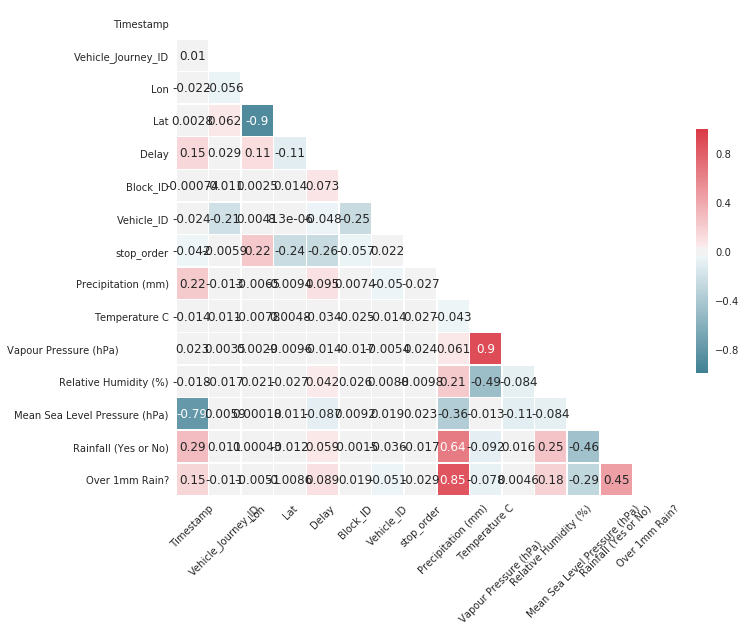

In [57]:
sns.set(style="white")

# Calculate correlation of all pairs of continuous features
corr = df[continuous_columns].corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom colormap - blue and red
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot=True, mask=mask, cmap=cmap, vmax=1, vmin=-1,
            square=True, xticklabels=True, yticklabels=True,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)
plt.yticks(rotation = 0)
plt.xticks(rotation = 45)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


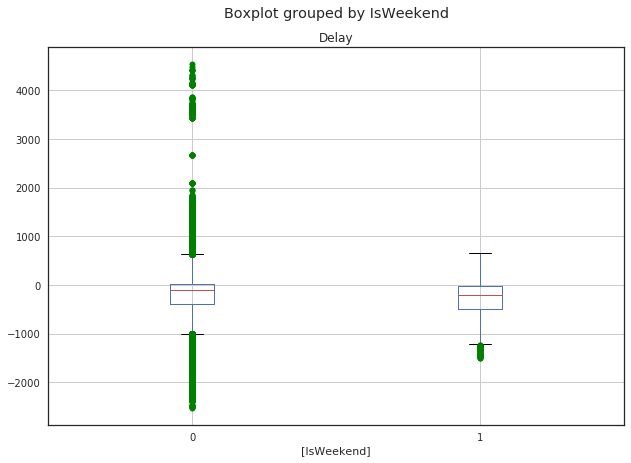

In [60]:
plt.figure()
flierprops = dict(marker='o', markerfacecolor='green', markersize=6,
                  linestyle='none')
bp = df.boxplot(column=['Delay'], by=['IsWeekend'], flierprops=flierprops, figsize=(10,7))
plt.savefig('IsWeekend_to_Delay.pdf')

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


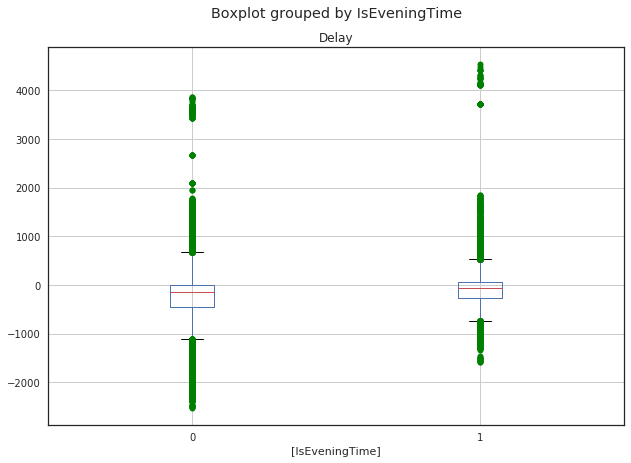

In [61]:
plt.figure()
flierprops = dict(marker='o', markerfacecolor='green', markersize=6,
                  linestyle='none')
bp = df.boxplot(column=['Delay'], by=['IsEveningTime'], flierprops=flierprops, figsize=(10,7))
plt.savefig('IsWeekend_to_Delay.pdf')

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


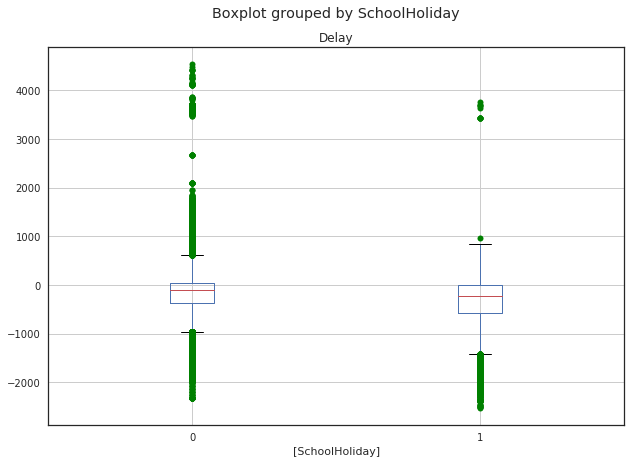

In [62]:
plt.figure()
flierprops = dict(marker='o', markerfacecolor='green', markersize=6,
                  linestyle='none')
bp = df.boxplot(column=['Delay'], by=['SchoolHoliday'], flierprops=flierprops, figsize=(10,7))
plt.savefig('IsWeekend_to_Delay.pdf')

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


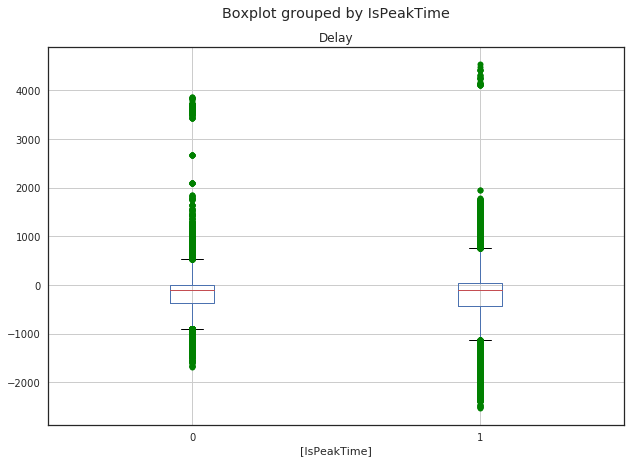

In [63]:
plt.figure()
flierprops = dict(marker='o', markerfacecolor='green', markersize=6,
                  linestyle='none')
bp = df.boxplot(column=['Delay'], by=['IsPeakTime'], flierprops=flierprops, figsize=(10,7))
plt.savefig('IsWeekend_to_Delay.pdf')

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


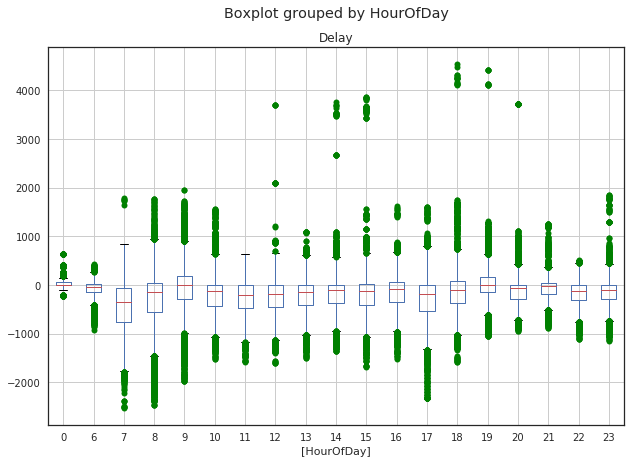

In [64]:
plt.figure()
flierprops = dict(marker='o', markerfacecolor='green', markersize=6,
                  linestyle='none')
bp = df.boxplot(column=['Delay'], by=['HourOfDay'], flierprops=flierprops, figsize=(10,7))
plt.savefig('IsWeekend_to_Delay.pdf')

# Looking into the journey pattern ID in order to establish what it means

# First run a given run on a route and investigate journey pattern ID vs other features

# Journey Pattern ID 00040001 - southbound bus - appears to be peak schedule

In [65]:
df_subset = df.loc[(df.Vehicle_ID == 43042) & (df.Vehicle_Journey_ID == 4915) & (df.Start_date == '2013-01-31') & (df.At_Stop == 1)]
df_subset.head()

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,...,SchoolHoliday,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
223256,1359617692000000,00040001,2013-01-31,4915,HN,-6.264970,53.402534,-10,4010,43042,...,0,0,Ballymun Road,0.2,5.5,7.4,81.0,1001.4,1,0
223261,1359617712000000,00040001,2013-01-31,4915,HN,-6.264970,53.402534,9,4010,43042,...,0,0,Ballymun Road,0.2,5.5,7.4,81.0,1001.4,1,0
223294,1359617830000000,00040001,2013-01-31,4915,HN,-6.263812,53.399124,-50,4010,43042,...,0,1,Ballymun Road,0.2,5.5,7.4,81.0,1001.4,1,0
223334,1359618013000000,00040001,2013-01-31,4915,HN,-6.263807,53.392265,-88,4010,43042,...,0,3,Ballymun Road,0.2,5.5,7.4,81.0,1001.4,1,0
223417,1359618412000000,00040001,2013-01-31,4915,HN,-6.265924,53.372498,-409,4010,43042,...,0,7,Mobhi Road,0.2,5.5,7.4,81.0,1001.4,1,0


In [66]:
df_subset.head()

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,...,SchoolHoliday,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
223256,1359617692000000,00040001,2013-01-31,4915,HN,-6.264970,53.402534,-10,4010,43042,...,0,0,Ballymun Road,0.2,5.5,7.4,81.0,1001.4,1,0
223261,1359617712000000,00040001,2013-01-31,4915,HN,-6.264970,53.402534,9,4010,43042,...,0,0,Ballymun Road,0.2,5.5,7.4,81.0,1001.4,1,0
223294,1359617830000000,00040001,2013-01-31,4915,HN,-6.263812,53.399124,-50,4010,43042,...,0,1,Ballymun Road,0.2,5.5,7.4,81.0,1001.4,1,0
223334,1359618013000000,00040001,2013-01-31,4915,HN,-6.263807,53.392265,-88,4010,43042,...,0,3,Ballymun Road,0.2,5.5,7.4,81.0,1001.4,1,0
223417,1359618412000000,00040001,2013-01-31,4915,HN,-6.265924,53.372498,-409,4010,43042,...,0,7,Mobhi Road,0.2,5.5,7.4,81.0,1001.4,1,0


In [67]:
for column in df_subset.columns:
    print(column + "," + str(len(df_subset[column].unique())))

Timestamp,24
Journey_Pattern_ID,1
Start_date,1
Vehicle_Journey_ID,1
Operator,1
Lon,19
Lat,18
Delay,19
Block_ID,1
Vehicle_ID,1
Stop_ID,17
At_Stop,1
Time,24
IsWeekend,1
HourOfDay,2
IsEveningTime,1
IsPeakTime,1
SchoolHoliday,1
stop_order,17
fullname,12
Precipitation (mm),2
Temperature C,2
Vapour Pressure (hPa)                ,2
Relative Humidity (%),2
Mean Sea Level Pressure (hPa),2
Rainfall (Yes or No),1
Over 1mm Rain?,1


Comments: timestamps are out of order, this subset starts later than it finishes. 
The delay of being 49 seconds ahead of schedule is not in line with the 1 hour schedule from Harristown to Monkstown. So the delay is against a schedule of 1 hour 30 minutes. This is a peak time - Thursday 31/1/2013. 
Block ID: 4010 - stays constant
Journey pattern ID: 00040001
This is a Southbound bus.

In [68]:
df_subset1 = df.loc[(df.Vehicle_ID == 33219) & (df.Vehicle_Journey_ID == 963581) & (df.Start_date == '2013-01-31') ]
df_subset1.to_csv("southbound.csv", encoding='utf-8', index=False)
df_subset1.head()

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,...,SchoolHoliday,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
224784,1359626709000000,00040001,2013-01-31,963581,HN,-6.26497,53.402534,-174,4069,33219,...,0,0,Ballymun Road,0.0,6.1,7.5,79.0,1004.9,0,0
224790,1359626731000000,00040001,2013-01-31,963581,HN,-6.26497,53.402534,-154,4069,33219,...,0,0,Ballymun Road,0.0,6.1,7.5,79.0,1004.9,0,0
224793,1359626761000000,00040001,2013-01-31,963581,HN,-6.26497,53.402534,-134,4069,33219,...,0,0,Ballymun Road,0.0,6.1,7.5,79.0,1004.9,0,0
224797,1359626774000000,00040001,2013-01-31,963581,HN,-6.26497,53.402534,-114,4069,33219,...,0,0,Ballymun Road,0.0,6.1,7.5,79.0,1004.9,0,0
224800,1359626791000000,00040001,2013-01-31,963581,HN,-6.26497,53.402534,-94,4069,33219,...,0,0,Ballymun Road,0.0,6.1,7.5,79.0,1004.9,0,0


In [69]:
for column in df_subset1.columns:
    print(column + "," + str(len(df_subset1[column].unique())))

Timestamp,56
Journey_Pattern_ID,1
Start_date,1
Vehicle_Journey_ID,1
Operator,1
Lon,45
Lat,45
Delay,36
Block_ID,1
Vehicle_ID,1
Stop_ID,14
At_Stop,2
Time,56
IsWeekend,1
HourOfDay,2
IsEveningTime,1
IsPeakTime,2
SchoolHoliday,1
stop_order,14
fullname,10
Precipitation (mm),1
Temperature C,2
Vapour Pressure (hPa)                ,2
Relative Humidity (%),2
Mean Sea Level Pressure (hPa),2
Rainfall (Yes or No),1
Over 1mm Rain?,1


Comments: the timestamps are out of order again, so the bus in fact finishes at 11.08 on the Monkstown Link Road, not at 10:55 on Merrion Road.
The journey delay is 25 mins ahead of schedule for a trip that began at 10.02 and finished at 11.08 which indicates that the 1 hour published schedule is not right as we should be 6 minutes behind schedule - clearly the real expected time was an hour and a half here - that is the same as the example above but this is much later in the morning - should adhere to the offpeak schedule?
Again this is a southbound bus, so comparable to the journey above except for peak/offpeak.
Again block ID is constant but for the same jouney in same direction it is 4069 - so different. 
Therefore block ID cannot represent the section of the journey pattern as per the instructions given on Moodle. But journey pattern ID is still 00040001 - so that is a bus from Harristown to Monkstown.
Congestion is zero even though this is a peak time bus run so not clear what drives the congestion column. 

# Journey Pattern ID 00041002 - northbound bus - offpeak schedule

In [70]:
df_subset2 = df.loc[(df.Vehicle_ID == 43044) & (df.Vehicle_Journey_ID == 4599) & (df.Start_date == '2013-01-03')]
df_subset2.head(2)

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,...,SchoolHoliday,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
22552,1357255765000000,00041002,2013-01-03,4599,HN,-6.151200,53.289516,0,4012,43044,...,1,0,Monkstown Ave,0.0,5.8,7.6,82.0,1018.7,0,0
22554,1357255787000000,00041002,2013-01-03,4599,HN,-6.152783,53.288834,0,4012,43044,...,1,0,Monkstown Ave,0.0,5.8,7.6,82.0,1018.7,0,0


In [71]:
for column in df_subset2.columns:
    print(column + "," + str(len(df_subset2[column].unique())))

Timestamp,53
Journey_Pattern_ID,1
Start_date,1
Vehicle_Journey_ID,1
Operator,1
Lon,42
Lat,41
Delay,11
Block_ID,1
Vehicle_ID,1
Stop_ID,4
At_Stop,2
Time,53
IsWeekend,1
HourOfDay,2
IsEveningTime,2
IsPeakTime,1
SchoolHoliday,1
stop_order,3
fullname,4
Precipitation (mm),1
Temperature C,1
Vapour Pressure (hPa)                ,1
Relative Humidity (%),1
Mean Sea Level Pressure (hPa),1
Rainfall (Yes or No),1
Over 1mm Rain?,1


Comments: again the timestamps are out of order. This is a Northbound bus. We lose it due to date filter near the end of it's trip. However it has travelled from Monkstown to O'Connell Street in 30 mins so it seems to be going on the offpeak scedule - 1 hour. 
The Northbound journey pattern ID is  	00041002.
The block ID is constant but unrelated to journey pattern at: 4012
HN - Harristown is the operator even though this but is travelling in the opposite direction - so operator is not reflective of starting bus depot - just the operator depot for this route it seems. Note this is the last run of a day (the 11.30pm bus).

# Journey Pattern ID 00041001 - northbound bus - offpeak schedule

In [72]:
df_subset3 = df.loc[(df.Vehicle_ID == 43039) & (df.Vehicle_Journey_ID == 4954) & (df.Start_date == '2013-01-31')]
df_subset3.head(2)

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,...,SchoolHoliday,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
225173,1359629257000000,00041001,2013-01-31,4954,HN,-6.157933,53.287117,47,4007,43039,...,0,0,Monkstown Ave,0.0,6.1,7.5,79.0,1004.9,0,0
225187,1359629401000000,00041001,2013-01-31,4954,HN,-6.166802,53.290535,-17,4007,43039,...,0,4,Rowan Pk,0.0,6.1,7.5,79.0,1004.9,0,0


This bus is going Northbound, but cuts off around 11AM.
Possibly one of the filters changes at 11AM.

In [73]:
df_subset3 = df.loc[ (df.Vehicle_Journey_ID == 4954) & (df.Start_date == '2013-01-31')]
df_subset3.head()

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,...,SchoolHoliday,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
225173,1359629257000000,00041001,2013-01-31,4954,HN,-6.157933,53.287117,47,4007,43039,...,0,0,Monkstown Ave,0.0,6.1,7.5,79.0,1004.9,0,0
225187,1359629401000000,00041001,2013-01-31,4954,HN,-6.166802,53.290535,-17,4007,43039,...,0,4,Rowan Pk,0.0,6.1,7.5,79.0,1004.9,0,0
225189,1359629413000000,00041001,2013-01-31,4954,HN,-6.166490,53.291435,-17,4007,43039,...,0,4,Rowan Pk,0.0,6.1,7.5,79.0,1004.9,0,0
225197,1359629499000000,00041001,2013-01-31,4954,HN,-6.171226,53.297417,-75,4007,43039,...,0,0,Stradbrook Rd,0.0,6.1,7.5,79.0,1004.9,0,0
225201,1359629511000000,00041001,2013-01-31,4954,HN,-6.175163,53.299015,-108,4007,43039,...,0,0,Stradbrook Rd,0.0,6.1,7.5,79.0,1004.9,0,0


In [74]:
for column in df_subset3.columns:
    print(column + "," + str(len(df_subset3[column].unique())))

Timestamp,13
Journey_Pattern_ID,1
Start_date,1
Vehicle_Journey_ID,1
Operator,1
Lon,10
Lat,10
Delay,9
Block_ID,1
Vehicle_ID,1
Stop_ID,4
At_Stop,2
Time,13
IsWeekend,1
HourOfDay,1
IsEveningTime,1
IsPeakTime,1
SchoolHoliday,1
stop_order,3
fullname,4
Precipitation (mm),1
Temperature C,1
Vapour Pressure (hPa)                ,1
Relative Humidity (%),1
Mean Sea Level Pressure (hPa),1
Rainfall (Yes or No),1
Over 1mm Rain?,1


No, having tried without the filters this bus stops on Rock Road only 12 minutes into its journey. 
GPS tracking issues?
This bus is different on Journey Pattern ID to the previous northbound buses, its Journey Pattern ID is 00041001. Also as before the block ID is constant but not in line with other journeys in same area/direction 4007.

In [75]:
df_subset4 = df.loc[(df.Vehicle_ID == 43046) & (df.Vehicle_Journey_ID == 15476) & (df.Start_date == '2013-01-01')]
df_subset4.to_csv("northbound.csv", encoding='utf-8', index=False)

This is a northbound bus - taking approx 58 minutes but coming in at only 19 seconds ahead of schedule. This was a bank holiday so this bus is travelling in non peak period. What is driving the different Journey Pattern ID _ possibly the non - peak period. It travels the same route with the same operator. The block ID is 4001 so it does tie into the Journey_Pattern_ID this time, unlike before. 


# Journey Pattern ID 00040002 - southbound bus - offpeak schedule

In [76]:
#df[df['Journey_Pattern_ID'] == '00040002']

In [77]:
df_subset5 = df.loc[(df.Vehicle_ID == 43047) & (df.Vehicle_Journey_ID == 4570) & (df.Start_date == '2013-01-25')]
df_subset5

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,...,SchoolHoliday,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?
192800,1359156835000000,00040002,2013-01-25,4570,HN,-6.264701,53.401489,-87,4003,43047,...,0,0,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192804,1359156854000000,00040002,2013-01-25,4570,HN,-6.264701,53.401489,-66,4003,43047,...,0,0,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192807,1359156874000000,00040002,2013-01-25,4570,HN,-6.264701,53.401489,-46,4003,43047,...,0,0,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192809,1359156894000000,00040002,2013-01-25,4570,HN,-6.264390,53.401051,-46,4003,43047,...,0,0,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192810,1359156913000000,00040002,2013-01-25,4570,HN,-6.263774,53.399456,-46,4003,43047,...,0,0,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192812,1359156933000000,00040002,2013-01-25,4570,HN,-6.263832,53.398941,-30,4003,43047,...,0,1,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192814,1359156954000000,00040002,2013-01-25,4570,HN,-6.264002,53.397152,-30,4003,43047,...,0,1,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192816,1359156974000000,00040002,2013-01-25,4570,HN,-6.264036,53.396618,-30,4003,43047,...,0,1,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192819,1359157054000000,00040002,2013-01-25,4570,HN,-6.263807,53.392265,-30,4003,43047,...,0,3,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0
192821,1359157073000000,00040002,2013-01-25,4570,HN,-6.263795,53.391975,-1,4003,43047,...,0,3,Ballymun Road,0.0,5.9,7.0,74.0,1000.1,0,0


Friday 25 Jan 2013 was a Friday but this is an offpeak bus.  It drops off at 11.51pm which is too early to be because of the date in the filter. It is a Southbound bus, last of the day. 

This bus has same vehicle journey ID on a different date - but it is the last bus Southbound for the day. Again it drops off when it reaches Parnell Square, not making the full journey. 


# Have established that the 5th number in Journey Pattern ID indicates direction - 0 southbound, 1 northbound

In [78]:
#splice direction from JourneyPatternID and create new binary column
df["Direction_Northbound"] =  np.where((df["Journey_Pattern_ID"].str[5] == '1'),1, 0)


# Block ID Analysis

In [79]:
block_df = df[df['Block_ID'] == 4001]
block_df.head(2)

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Lon,Lat,Delay,Block_ID,Vehicle_ID,...,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?,Direction_Northbound
77,1357029284000000,00040001,2013-01-01,15475,HN,-6.264970,53.402534,-8,4001,43046,...,0,Ballymun Road,0.0,2.0,6.3,89.0,1005.9,0,0,0
78,1357029305000000,00040001,2013-01-01,15475,HN,-6.264873,53.401844,-8,4001,43046,...,0,Ballymun Road,0.0,2.0,6.3,89.0,1005.9,0,0,0


In [80]:
for column in block_df.columns:
    print(column + "," + str(len(block_df[column].unique())))

Timestamp,25535
Journey_Pattern_ID,2
Start_date,31
Vehicle_Journey_ID,65
Operator,1
Lon,6926
Lat,7021
Delay,1829
Block_ID,1
Vehicle_ID,39
Stop_ID,30
At_Stop,2
Time,25535
IsWeekend,2
HourOfDay,19
IsEveningTime,2
IsPeakTime,2
SchoolHoliday,2
stop_order,24
fullname,18
Precipitation (mm),23
Temperature C,120
Vapour Pressure (hPa)                ,65
Relative Humidity (%),38
Mean Sea Level Pressure (hPa),218
Rainfall (Yes or No),2
Over 1mm Rain?,2
Direction_Northbound,1


Notes: This highlights nothing about the use of block ID. We may not need it. 

# Drop for 1st model- not for good

In [81]:
df = df.drop('Lat', axis=1)

In [82]:
df = df.drop('Lon', axis=1)

In [83]:
df = df.drop('Block_ID', axis=1)

In [84]:
df.head(2)

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Delay,Vehicle_ID,Stop_ID,At_Stop,Time,...,stop_order,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?,Direction_Northbound
1,1356998427000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:00:27,...,13,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0
3,1356998485000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:01:25,...,13,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0


In [85]:
df.columns

Index(['Timestamp', 'Journey_Pattern_ID', 'Start_date', 'Vehicle_Journey_ID',
       'Operator', 'Delay', 'Vehicle_ID', 'Stop_ID', 'At_Stop', 'Time',
       'IsWeekend', 'HourOfDay', 'IsEveningTime', 'IsPeakTime',
       'SchoolHoliday', 'stop_order', 'fullname', 'Precipitation (mm)',
       'Temperature C', 'Vapour Pressure (hPa)                ',
       'Relative Humidity (%)', 'Mean Sea Level Pressure (hPa)',
       'Rainfall (Yes or No)', 'Over 1mm Rain?', 'Direction_Northbound'],
      dtype='object')

/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


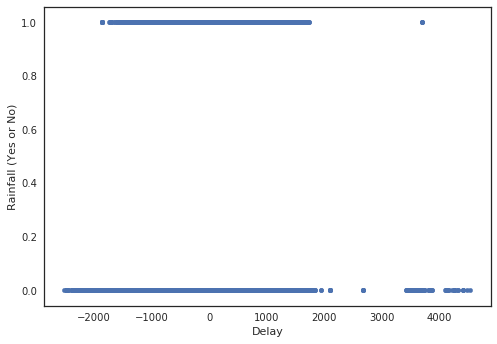

In [86]:
df.plot(kind='scatter', x='Delay', y='Rainfall (Yes or No)')

# Linear model - need a time vs distance to generate speed in km/hour

The delay is in seconds. We need to prepare a model that compares to delay for testing. 

We need distance in stops or in real distances based on lon/lat positions
We need, if using stops, to assume an equal distance between stops
% Distance will be stop_order_number / total number of stops 
Time will be % distance * overall schedule time (which is 60 minutes per the offpeak #4 bus schedule)
That should give a base schedule to check against. 
Real delay is per the dataframe. 
To model a delay we need to add features to time function above 
To model a correct time function we should take stop_order(min) from stop_order(current) Timestamp

In [87]:
df['time_diff'] = df.groupby(['stop_order','Journey_Pattern_ID', 'Start_date', 'HourOfDay'])['Time'].diff()

In [88]:
df.columns

Index(['Timestamp', 'Journey_Pattern_ID', 'Start_date', 'Vehicle_Journey_ID',
       'Operator', 'Delay', 'Vehicle_ID', 'Stop_ID', 'At_Stop', 'Time',
       'IsWeekend', 'HourOfDay', 'IsEveningTime', 'IsPeakTime',
       'SchoolHoliday', 'stop_order', 'fullname', 'Precipitation (mm)',
       'Temperature C', 'Vapour Pressure (hPa)                ',
       'Relative Humidity (%)', 'Mean Sea Level Pressure (hPa)',
       'Rainfall (Yes or No)', 'Over 1mm Rain?', 'Direction_Northbound',
       'time_diff'],
      dtype='object')

In [89]:
df.time_diff.interpolate()
df.head()

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Delay,Vehicle_ID,Stop_ID,At_Stop,Time,...,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?,Direction_Northbound,time_diff
1,1356998427000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:00:27,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,NaT
3,1356998485000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:01:25,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,00:00:58
5,1356998546000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:02:26,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,00:01:01
7,1356998607000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:03:27,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,00:01:01
9,1356998665000000,00041002,2012-12-31,4292,HN,0,43035,281,0,2013-01-01 00:04:25,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,00:00:58


In [82]:

df['%_distance_travelled'] = df.stop_order.div(df.stop_order.max(), axis='index')

In [83]:
df=df.drop_duplicates(subset='Time', keep='first')

In [90]:
df.head()

,Timestamp,Journey_Pattern_ID,Start_date,Vehicle_Journey_ID,Operator,Delay,Vehicle_ID,Stop_ID,At_Stop,Time,...,fullname,Precipitation (mm),Temperature C,Vapour Pressure (hPa),Relative Humidity (%),Mean Sea Level Pressure (hPa),Rainfall (Yes or No),Over 1mm Rain?,Direction_Northbound,time_diff
1,1356998427000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:00:27,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,NaT
3,1356998485000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:01:25,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,00:00:58
5,1356998546000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:02:26,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,00:01:01
7,1356998607000000,00041002,2012-12-31,4599,HN,0,43035,281,1,2013-01-01 00:03:27,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,00:01:01
9,1356998665000000,00041002,2012-12-31,4292,HN,0,43035,281,0,2013-01-01 00:04:25,...,O'Connell St,0.0,3.1,6.8,88.0,1000.2,0,0,0,00:00:58


# Run a random forest to see which features are most significant

The doubt about the target feature impacts us here.

In [91]:
df.columns

Index(['Timestamp', 'Journey_Pattern_ID', 'Start_date', 'Vehicle_Journey_ID',
       'Operator', 'Delay', 'Vehicle_ID', 'Stop_ID', 'At_Stop', 'Time',
       'IsWeekend', 'HourOfDay', 'IsEveningTime', 'IsPeakTime',
       'SchoolHoliday', 'stop_order', 'fullname', 'Precipitation (mm)',
       'Temperature C', 'Vapour Pressure (hPa)                ',
       'Relative Humidity (%)', 'Mean Sea Level Pressure (hPa)',
       'Rainfall (Yes or No)', 'Over 1mm Rain?', 'Direction_Northbound',
       'time_diff'],
      dtype='object')

# Random forest
y, X = dmatrices('Delay ~  IsPeakTime+IsEveningTime+SchoolHoliday+Temperature C+Relative Humidity+Rainfall (Yes or No)+Over 1mm Rain?+Direction_Northbound+Mean Sea Level Pressure (hPa)+Precipitation (mm)+HourOfDay+Operator+Journey_Pattern_ID+Vehicle_Journey_ID', df, return_type="dataframe") 
y = np.ravel(y)
X.head(5)

# Train RF with 100 trees
rfc = RandomForestClassifier(n_estimators=100, max_features='auto', oob_score=True, random_state=1)

# Fit model on dataset
rfc.fit(X, y)

# Print the features as ranked by random forest importance. 

pd.DataFrame({'feature': X.columns, 'importance':rfc.feature_importances_})

In [98]:
from sklearn.ensemble import RandomForestRegressor

In [99]:
from sklearn.metrics import roc_auc_score

In [100]:
x = df

In [101]:
y = x.pop("Delay")

#error on out of bag score so try below without 
model =  RandomForestRegressor(n_estimator = 100 , oob_score = TRUE, random_state = 42)

In [103]:
model =  RandomForestRegressor(n_estimator = 100 , random_state = 42)

TypeError: __init__() got an unexpected keyword argument 'n_estimator'

In [ ]:
model.fit(x(numeric_variable,y)

In [ ]:
print ("AUC - ROC : ", roc_auc_score(y,model.oob_prediction))

In [95]:
df_group = df.groupby(['HourOfDay' ,'Start_date', 'Vehicle_Journey_ID'])

In [96]:
from statsmodels.formula.api import ols

for k, g in df_group:
    model = ols('Timestamp ~ stop_order', g)
    results = model.fit()
    print(results.summary())

/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/stats/stattools.py:72: ValueWarning: omni_normtest is not valid with less than 8 observations; 1 samples were given.
  "samples were given." % int(n), ValueWarning)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1386: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1392: RuntimeWarning: invalid value encountered in true_divide
  return 1 - np.divide(self.nobs - self.k_constant, self.df_resid) * (1 - self.rsquared)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1396: RuntimeWarning: divide by zero encountered in double_scalars
  return self.ess/self.df_model
/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1400: RuntimeWarning: divide by zero encountered in do

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:29   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   7.982e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:29   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.922e+11        nan        nan        n

/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/stats/stattools.py:72: ValueWarning: omni_normtest is not valid with less than 8 observations; 6 samples were given.
  "samples were given." % int(n), ValueWarning)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1334: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=16
  "anyway, n=%i" % int(n))
/home/ubuntu/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1334: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=18
  "anyway, n=%i" % int(n))
/home/ubuntu/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1334: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=19
  "anyway, n=%i" % int(n))


                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:29   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.926e+11        inf          0        n

/home/ubuntu/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1334: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=9
  "anyway, n=%i" % int(n))
/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1471: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(eigvals[0]/eigvals[-1])
/home/ubuntu/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1334: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  "anyway, n=%i" % int(n))
/home/ubuntu/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1334: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  "anyway, n=%i" % int(n))


                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:30   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    8.93e+11        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:30   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15        nan        nan        n

/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:1036: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/home/ubuntu/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1334: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  "anyway, n=%i" % int(n))


                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     3083.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.39e-21
Time:                        13:07:30   Log-Likelihood:                -381.64
No. Observations:                  20   AIC:                             767.3
Df Residuals:                      18   BIC:                             769.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   1.65e+07   8.24e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     2130.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.56e-35
Time:                        13:07:30   Log-Likelihood:                -799.51
No. Observations:                  40   AIC:                             1603.
Df Residuals:                      38   BIC:                             1606.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.31e+07    4.1e+07      0.0

/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/stats/stattools.py:72: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  "samples were given." % int(n), ValueWarning)



                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.975
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     1386.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.43e-30
Time:                        13:07:31   Log-Likelihood:                -763.30
No. Observations:                  38   AIC:                             1531.
Df Residuals:                      36   BIC:                             1534.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.14e+07   3.28e+07      0.

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:31   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.893
Method:                 Least Squares   F-statistic:                     134.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.99e-09
Time:                        13:07:31   Log-Likelihood:                -349.42
No. Observations:                  17   AIC:                             702.8
Df Residuals:                      15   BIC:                             704.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.87e+07   1.72e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     1661.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.39e-36
Time:                        13:07:31   Log-Likelihood:                -928.08
No. Observations:                  46   AIC:                             1860.
Df Residuals:                      44   BIC:                             1864.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    4.1e+07   3.31e+07      0.0

/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/stats/stattools.py:72: ValueWarning: omni_normtest is not valid with less than 8 observations; 3 samples were given.
  "samples were given." % int(n), ValueWarning)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/stats/stattools.py:72: ValueWarning: omni_normtest is not valid with less than 8 observations; 7 samples were given.
  "samples were given." % int(n), ValueWarning)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1334: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=13
  "anyway, n=%i" % int(n))



                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:31   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.972
Method:                 Least Squares   F-statistic:                     1104.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           8.33e-26
Time:                        13:07:32   Log-Likelihood:                -664.54
No. Observations:                  33   AIC:                             1333.
Df Residuals:                      31   BIC:                             1336.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.11e+07   3.31e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.242
Model:                            OLS   Adj. R-squared:                  0.211
Method:                 Least Squares   F-statistic:                     7.679
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0106
Time:                        13:07:32   Log-Likelihood:                -537.24
No. Observations:                  26   AIC:                             1078.
Df Residuals:                      24   BIC:                             1081.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.83e+07   2.81e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.294
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     3.330
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.105
Time:                        13:07:32   Log-Likelihood:                -201.25
No. Observations:                  10   AIC:                             406.5
Df Residuals:                       8   BIC:                             407.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   5.23e+07    2.6e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.972
Method:                 Least Squares   F-statistic:                     1240.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.45e-29
Time:                        13:07:32   Log-Likelihood:                -744.98
No. Observations:                  37   AIC:                             1494.
Df Residuals:                      35   BIC:                             1497.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.03e+07   3.37e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     1703.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.59e-33
Time:                        13:07:32   Log-Likelihood:                -806.19
No. Observations:                  40   AIC:                             1616.
Df Residuals:                      38   BIC:                             1620.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   3.87e+07   3.52e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.213
Model:                            OLS   Adj. R-squared:                  0.156
Method:                 Least Squares   F-statistic:                     3.782
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0722
Time:                        13:07:33   Log-Likelihood:                -329.66
No. Observations:                  16   AIC:                             663.3
Df Residuals:                      14   BIC:                             664.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   6.86e+07   1.98e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.972
Method:                 Least Squares   F-statistic:                     1872.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.88e-42
Time:                        13:07:33   Log-Likelihood:                -1086.2
No. Observations:                  54   AIC:                             2176.
Df Residuals:                      52   BIC:                             2180.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   5.43e+07    2.5e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.020
Method:                 Least Squares   F-statistic:                     2.100
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.153
Time:                        13:07:33   Log-Likelihood:                -1230.8
No. Observations:                  56   AIC:                             2466.
Df Residuals:                      54   BIC:                             2470.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.52e+08   2.46e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:33   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.047e+12        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                 -0.011
Method:                 Least Squares   F-statistic:                    0.7052
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.408
Time:                        13:07:33   Log-Likelihood:                -622.17
No. Observations:                  29   AIC:                             1248.
Df Residuals:                      27   BIC:                             1251.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.58e+08   3.79e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.917
Model:                            OLS   Adj. R-squared:                  0.909
Method:                 Least Squares   F-statistic:                     121.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.83e-07
Time:                        13:07:34   Log-Likelihood:                -243.50
No. Observations:                  13   AIC:                             491.0
Df Residuals:                      11   BIC:                             492.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.44e+07   9.45e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.744
Model:                            OLS   Adj. R-squared:                  0.741
Method:                 Least Squares   F-statistic:                     264.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.09e-28
Time:                        13:07:34   Log-Likelihood:                -1957.9
No. Observations:                  93   AIC:                             3920.
Df Residuals:                      91   BIC:                             3925.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.35e+08   5.79e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     419.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.47e-33
Time:                        13:07:34   Log-Likelihood:                -1701.0
No. Observations:                  81   AIC:                             3406.
Df Residuals:                      79   BIC:                             3411.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.08e+08   6.54e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.925
Model:                            OLS   Adj. R-squared:                  0.924
Method:                 Least Squares   F-statistic:                     693.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.18e-33
Time:                        13:07:34   Log-Likelihood:                -1200.4
No. Observations:                  58   AIC:                             2405.
Df Residuals:                      56   BIC:                             2409.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.14e+08   1.19e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     611.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.81e-16
Time:                        13:07:34   Log-Likelihood:                -426.55
No. Observations:                  22   AIC:                             857.1
Df Residuals:                      20   BIC:                             859.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.51e+07   5.41e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                     1351.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.36e-46
Time:                        13:07:35   Log-Likelihood:                -1440.5
No. Observations:                  70   AIC:                             2885.
Df Residuals:                      68   BIC:                             2889.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   8.71e+07   1.56e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.3668
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.546
Time:                        13:07:35   Log-Likelihood:                -1837.7
No. Observations:                  84   AIC:                             3679.
Df Residuals:                      82   BIC:                             3684.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.96e+08   2.74e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                 -0.005
Method:                 Least Squares   F-statistic:                    0.6856
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.411
Time:                        13:07:35   Log-Likelihood:                -1528.6
No. Observations:                  70   AIC:                             3061.
Df Residuals:                      68   BIC:                             3066.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   5.23e+08    2.6e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.444
Model:                            OLS   Adj. R-squared:                  0.434
Method:                 Least Squares   F-statistic:                     42.36
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.78e-08
Time:                        13:07:35   Log-Likelihood:                -1202.9
No. Observations:                  55   AIC:                             2410.
Df Residuals:                      53   BIC:                             2414.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.54e+08   5.35e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.914
Method:                 Least Squares   F-statistic:                     520.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.05e-27
Time:                        13:07:35   Log-Likelihood:                -1051.6
No. Observations:                  50   AIC:                             2107.
Df Residuals:                      48   BIC:                             2111.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15    6.6e+07   2.06e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     2840.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.33e-51
Time:                        13:07:36   Log-Likelihood:                -1229.7
No. Observations:                  61   AIC:                             2463.
Df Residuals:                      59   BIC:                             2468.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.25e+07    3.2e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     376.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.18e-17
Time:                        13:07:36   Log-Likelihood:                -578.63
No. Observations:                  29   AIC:                             1161.
Df Residuals:                      27   BIC:                             1164.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.54e+07      3e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:36   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.510
Model:                            OLS   Adj. R-squared:                  0.500
Method:                 Least Squares   F-statistic:                     52.98
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.97e-09
Time:                        13:07:36   Log-Likelihood:                -1156.2
No. Observations:                  53   AIC:                             2316.
Df Residuals:                      51   BIC:                             2320.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   2.22e+08   6.14e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:37   Log-Likelihood:                -605.61
No. Observations:                  30   AIC:                             1213.
Df Residuals:                      29   BIC:                             1215.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.176e+12   8.09e+04   5.16e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:37   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     871.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.43e-12
Time:                        13:07:37   Log-Likelihood:                -261.92
No. Observations:                  14   AIC:                             527.8
Df Residuals:                      12   BIC:                             529.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   1.14e+07   1.19e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.010
Method:                 Least Squares   F-statistic:                   0.05333
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.818
Time:                        13:07:37   Log-Likelihood:                -2031.1
No. Observations:                  93   AIC:                             4066.
Df Residuals:                      91   BIC:                             4071.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15    4.8e+08   2.83e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.963
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     836.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.64e-24
Time:                        13:07:37   Log-Likelihood:                -678.76
No. Observations:                  34   AIC:                             1362.
Df Residuals:                      32   BIC:                             1365.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   8.32e+07   1.63e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.282
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     13.35
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000863
Time:                        13:07:38   Log-Likelihood:                -753.67
No. Observations:                  36   AIC:                             1511.
Df Residuals:                      34   BIC:                             1515.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.69e+07   2.39e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.478
Model:                            OLS   Adj. R-squared:                  0.454
Method:                 Least Squares   F-statistic:                     20.15
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000183
Time:                        13:07:38   Log-Likelihood:                -498.01
No. Observations:                  24   AIC:                             1000.
Df Residuals:                      22   BIC:                             1002.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.44e+07   2.11e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.296
Model:                            OLS   Adj. R-squared:                  0.254
Method:                 Least Squares   F-statistic:                     7.137
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0161
Time:                        13:07:38   Log-Likelihood:                -391.68
No. Observations:                  19   AIC:                             787.4
Df Residuals:                      17   BIC:                             789.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    5.9e+07    2.3e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.949
Method:                 Least Squares   F-statistic:                     426.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.74e-16
Time:                        13:07:38   Log-Likelihood:                -458.47
No. Observations:                  24   AIC:                             920.9
Df Residuals:                      22   BIC:                             923.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.28e+08   1.06e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     2013.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.27e-39
Time:                        13:07:38   Log-Likelihood:                -972.00
No. Observations:                  48   AIC:                             1948.
Df Residuals:                      46   BIC:                             1952.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    3.8e+07   3.58e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.879
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     444.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.03e-29
Time:                        13:07:39   Log-Likelihood:                -1343.8
No. Observations:                  63   AIC:                             2692.
Df Residuals:                      61   BIC:                             2696.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.29e+07   1.86e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.911
Model:                            OLS   Adj. R-squared:                  0.910
Method:                 Least Squares   F-statistic:                     525.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.64e-28
Time:                        13:07:39   Log-Likelihood:                -1121.4
No. Observations:                  53   AIC:                             2247.
Df Residuals:                      51   BIC:                             2251.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    6.4e+07   2.12e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.054
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     2.154
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.150
Time:                        13:07:39   Log-Likelihood:                -865.75
No. Observations:                  40   AIC:                             1735.
Df Residuals:                      38   BIC:                             1739.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.65e+08   3.72e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                 -0.014
Method:                 Least Squares   F-statistic:                    0.3967
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.532
Time:                        13:07:39   Log-Likelihood:                -962.89
No. Observations:                  44   AIC:                             1930.
Df Residuals:                      42   BIC:                             1933.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.73e+08   2.87e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     666.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.30e-13
Time:                        13:07:39   Log-Likelihood:                -311.82
No. Observations:                  16   AIC:                             627.6
Df Residuals:                      14   BIC:                             629.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.89e+07   4.69e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.093
Model:                            OLS   Adj. R-squared:                  0.074
Method:                 Least Squares   F-statistic:                     4.735
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0347
Time:                        13:07:40   Log-Likelihood:                -1019.0
No. Observations:                  48   AIC:                             2042.
Df Residuals:                      46   BIC:                             2046.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.17e+07    2.2e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     904.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.34e-28
Time:                        13:07:40   Log-Likelihood:                -815.57
No. Observations:                  41   AIC:                             1635.
Df Residuals:                      39   BIC:                             1639.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.09e+08   1.24e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     909.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.23e-28
Time:                        13:07:40   Log-Likelihood:                -824.93
No. Observations:                  41   AIC:                             1654.
Df Residuals:                      39   BIC:                             1657.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15    9.7e+07    1.4e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     5702.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.25e-52
Time:                        13:07:40   Log-Likelihood:                -999.47
No. Observations:                  51   AIC:                             2003.
Df Residuals:                      49   BIC:                             2007.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.74e+07   3.64e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.202
Model:                            OLS   Adj. R-squared:                  0.176
Method:                 Least Squares   F-statistic:                     7.614
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00977
Time:                        13:07:40   Log-Likelihood:                -674.58
No. Observations:                  32   AIC:                             1353.
Df Residuals:                      30   BIC:                             1356.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.62e+07   2.05e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     2153.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.65e-47
Time:                        13:07:41   Log-Likelihood:                -1196.4
No. Observations:                  59   AIC:                             2397.
Df Residuals:                      57   BIC:                             2401.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.29e+07   3.17e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.025
Method:                 Least Squares   F-statistic:                   0.01365
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.908
Time:                        13:07:41   Log-Likelihood:                -902.10
No. Observations:                  41   AIC:                             1808.
Df Residuals:                      39   BIC:                             1812.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.44e+08   2.11e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                 -0.010
Method:                 Least Squares   F-statistic:                    0.5960
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.445
Time:                        13:07:41   Log-Likelihood:                -921.78
No. Observations:                  42   AIC:                             1848.
Df Residuals:                      40   BIC:                             1851.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   5.82e+08   2.34e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.971
Method:                 Least Squares   F-statistic:                     780.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.11e-18
Time:                        13:07:41   Log-Likelihood:                -466.75
No. Observations:                  24   AIC:                             937.5
Df Residuals:                      22   BIC:                             939.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   2.38e+07   5.71e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     1137.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.45e-23
Time:                        13:07:42   Log-Likelihood:                -546.18
No. Observations:                  28   AIC:                             1096.
Df Residuals:                      26   BIC:                             1099.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15    2.3e+07   5.92e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.397
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.240
Time:                        13:07:42   Log-Likelihood:                -2234.1
No. Observations:                 101   AIC:                             4472.
Df Residuals:                      99   BIC:                             4477.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15    6.1e+08   2.22e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:42   Log-Likelihood:                -30.469
No. Observations:                   2   AIC:                             62.94
Df Residuals:                       1   BIC:                             61.63
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15      1e+06   1.36e+09      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:42   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                     1296.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.95e-38
Time:                        13:07:42   Log-Likelihood:                -1104.5
No. Observations:                  54   AIC:                             2213.
Df Residuals:                      52   BIC:                             2217.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   5.53e+07   2.45e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     3716.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.43e-41
Time:                        13:07:43   Log-Likelihood:                -814.11
No. Observations:                  42   AIC:                             1632.
Df Residuals:                      40   BIC:                             1636.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.49e+07   3.89e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     614.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.73e-16
Time:                        13:07:43   Log-Likelihood:                -423.54
No. Observations:                  22   AIC:                             851.1
Df Residuals:                      20   BIC:                             853.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.03e+07   6.68e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     185.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.56e-15
Time:                        13:07:43   Log-Likelihood:                -770.46
No. Observations:                  36   AIC:                             1545.
Df Residuals:                      34   BIC:                             1548.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.32e+08   1.02e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.867
Model:                            OLS   Adj. R-squared:                  0.856
Method:                 Least Squares   F-statistic:                     78.21
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.33e-06
Time:                        13:07:43   Log-Likelihood:                -271.47
No. Observations:                  14   AIC:                             546.9
Df Residuals:                      12   BIC:                             548.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.72e+08   4.98e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.086
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.038
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.330
Time:                        13:07:43   Log-Likelihood:                -264.88
No. Observations:                  13   AIC:                             533.8
Df Residuals:                      11   BIC:                             534.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.14e+07   2.21e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.742
Model:                            OLS   Adj. R-squared:                  0.736
Method:                 Least Squares   F-statistic:                     115.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.39e-13
Time:                        13:07:44   Log-Likelihood:                -878.02
No. Observations:                  42   AIC:                             1760.
Df Residuals:                      40   BIC:                             1764.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.54e+08   5.35e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     330.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.74e-15
Time:                        13:07:44   Log-Likelihood:                -499.92
No. Observations:                  24   AIC:                             1004.
Df Residuals:                      22   BIC:                             1006.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   8.48e+07    1.6e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     1239.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.91e-37
Time:                        13:07:44   Log-Likelihood:                -1089.5
No. Observations:                  53   AIC:                             2183.
Df Residuals:                      51   BIC:                             2187.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.39e+07   2.52e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:44   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.923e+11        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.373
Model:                            OLS   Adj. R-squared:                  0.316
Method:                 Least Squares   F-statistic:                     6.550
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0266
Time:                        13:07:44   Log-Likelihood:                -265.27
No. Observations:                  13   AIC:                             534.5
Df Residuals:                      11   BIC:                             535.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.12e+07   1.91e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     970.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.62e-19
Time:                        13:07:45   Log-Likelihood:                -440.76
No. Observations:                  23   AIC:                             885.5
Df Residuals:                      21   BIC:                             887.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.71e+07   7.93e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.761
Model:                            OLS   Adj. R-squared:                  0.755
Method:                 Least Squares   F-statistic:                     127.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.39e-14
Time:                        13:07:45   Log-Likelihood:                -906.35
No. Observations:                  42   AIC:                             1817.
Df Residuals:                      40   BIC:                             1820.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.63e+08   8.31e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.145
Model:                            OLS   Adj. R-squared:                  0.116
Method:                 Least Squares   F-statistic:                     5.082
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0316
Time:                        13:07:45   Log-Likelihood:                -678.66
No. Observations:                  32   AIC:                             1361.
Df Residuals:                      30   BIC:                             1364.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.45e+08   5.55e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     3736.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.47e-39
Time:                        13:07:45   Log-Likelihood:                -773.39
No. Observations:                  40   AIC:                             1551.
Df Residuals:                      38   BIC:                             1554.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.76e+07   3.62e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.121
Model:                            OLS   Adj. R-squared:                  0.099
Method:                 Least Squares   F-statistic:                     5.514
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0239
Time:                        13:07:45   Log-Likelihood:                -893.66
No. Observations:                  42   AIC:                             1791.
Df Residuals:                      40   BIC:                             1795.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.33e+08   5.83e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.064
Model:                            OLS   Adj. R-squared:                 -0.029
Method:                 Least Squares   F-statistic:                    0.6860
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.427
Time:                        13:07:46   Log-Likelihood:                -246.30
No. Observations:                  12   AIC:                             496.6
Df Residuals:                      10   BIC:                             497.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   7.62e+07   1.78e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.028
Method:                 Least Squares   F-statistic:                   0.09661
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.758
Time:                        13:07:46   Log-Likelihood:                -732.52
No. Observations:                  34   AIC:                             1469.
Df Residuals:                      32   BIC:                             1472.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.73e+08   3.64e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:46   Log-Likelihood:                -132.53
No. Observations:                   7   AIC:                             267.1
Df Residuals:                       6   BIC:                             267.0
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.686e+12   5.69e+04   8.24e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     640.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.16e-16
Time:                        13:07:46   Log-Likelihood:                -439.34
No. Observations:                  22   AIC:                             882.7
Df Residuals:                      20   BIC:                             884.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   9.55e+07   1.42e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     1705.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.56e-42
Time:                        13:07:47   Log-Likelihood:                -1149.5
No. Observations:                  56   AIC:                             2303.
Df Residuals:                      54   BIC:                             2307.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.05e+07   2.25e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     3194.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.72e-33
Time:                        13:07:47   Log-Likelihood:                -633.24
No. Observations:                  33   AIC:                             1270.
Df Residuals:                      31   BIC:                             1273.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.26e+07   4.17e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:47   Log-Likelihood:                -155.57
No. Observations:                   8   AIC:                             313.1
Df Residuals:                       7   BIC:                             313.2
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.182e+12   7.84e+04   5.33e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.162
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     1.736
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.220
Time:                        13:07:47   Log-Likelihood:                -225.41
No. Observations:                  11   AIC:                             454.8
Df Residuals:                       9   BIC:                             455.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   7.94e+07   1.71e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:47   Log-Likelihood:                -92.557
No. Observations:                   5   AIC:                             187.1
Df Residuals:                       4   BIC:                             186.7
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   7.996e+12   7.79e+04   1.03e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     2743.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.90e-40
Time:                        13:07:48   Log-Likelihood:                -865.06
No. Observations:                  44   AIC:                             1734.
Df Residuals:                      42   BIC:                             1738.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.27e+07   3.18e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.962
Model:                            OLS   Adj. R-squared:                  0.959
Method:                 Least Squares   F-statistic:                     306.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.51e-10
Time:                        13:07:48   Log-Likelihood:                -268.61
No. Observations:                  14   AIC:                             541.2
Df Residuals:                      12   BIC:                             542.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:48   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:48   Log-Likelihood:                -31.855
No. Observations:                   2   AIC:                             65.71
Df Residuals:                       1   BIC:                             64.40
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15      2e+06   6.79e+08      0.0

[2] The input rank is higher than the number of observations.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.781
Model:                            OLS   Adj. R-squared:                  0.778
Method:                 Least Squares   F-statistic:                     256.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.96e-25
Time:                        13:07:48   Log-Likelihood:                -1526.2
No. Observations:                  74   AIC:                             3056.
Df Residuals:                      72   BIC:                             3061.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.039
Method:                 Least Squares   F-statistic:                     2.241
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.145
Time:                        13:07:49   Log-Likelihood:                -680.46
No. Observations:                  32   AIC:                             1365.
Df Residuals:                      30   BIC:                             1368.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.71e+08   5.01e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.049
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     1.387
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.249
Time:                        13:07:49   Log-Likelihood:                -613.83
No. Observations:                  29   AIC:                             1232.
Df Residuals:                      27   BIC:                             1234.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.63e+08   5.16e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.511
Method:                 Least Squares   F-statistic:                     64.87
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.96e-11
Time:                        13:07:49   Log-Likelihood:                -1356.4
No. Observations:                  62   AIC:                             2717.
Df Residuals:                      60   BIC:                             2721.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.27e+08   5.99e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     1175.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.93e-17
Time:                        13:07:49   Log-Likelihood:                -370.32
No. Observations:                  19   AIC:                             744.6
Df Residuals:                      17   BIC:                             746.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.53e+07   5.36e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.589
Model:                            OLS   Adj. R-squared:                  0.579
Method:                 Least Squares   F-statistic:                     58.85
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.89e-09
Time:                        13:07:49   Log-Likelihood:                -886.00
No. Observations:                  43   AIC:                             1776.
Df Residuals:                      41   BIC:                             1780.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                     607.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.19e-28
Time:                        13:07:50   Log-Likelihood:                -971.96
No. Observations:                  47   AIC:                             1948.
Df Residuals:                      45   BIC:                             1952.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.15e+08   1.18e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:50   Log-Likelihood:                -1012.7
No. Observations:                  49   AIC:                             2027.
Df Residuals:                      48   BIC:                             2029.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.921e+11   2.17e+04   4.11e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:50   Log-Likelihood:                -112.59
No. Observations:                   6   AIC:                             227.2
Df Residuals:                       5   BIC:                             227.0
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.682e+12   5.26e+04    8.9e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.777
Method:                 Least Squares   F-statistic:                     84.74
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.56e-09
Time:                        13:07:50   Log-Likelihood:                -493.74
No. Observations:                  25   AIC:                             991.5
Df Residuals:                      23   BIC:                             993.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:50   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.965
Method:                 Least Squares   F-statistic:                     1260.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.04e-34
Time:                        13:07:51   Log-Likelihood:                -939.08
No. Observations:                  46   AIC:                             1882.
Df Residuals:                      44   BIC:                             1886.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.61e+07   2.95e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.030
Method:                 Least Squares   F-statistic:                  0.002015
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.964
Time:                        13:07:51   Log-Likelihood:                -773.82
No. Observations:                  35   AIC:                             1552.
Df Residuals:                      33   BIC:                             1555.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     732.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.28e-23
Time:                        13:07:51   Log-Likelihood:                -700.83
No. Observations:                  34   AIC:                             1406.
Df Residuals:                      32   BIC:                             1409.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.81e+07   2.34e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:51   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.103
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.297
Time:                        13:07:51   Log-Likelihood:                -1584.7
No. Observations:                  72   AIC:                             3173.
Df Residuals:                      70   BIC:                             3178.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.91e+08   2.77e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.103
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.030
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.337
Time:                        13:07:52   Log-Likelihood:                -222.57
No. Observations:                  11   AIC:                             449.1
Df Residuals:                       9   BIC:                             449.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.59e+07   2.06e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     615.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.35e-09
Time:                        13:07:52   Log-Likelihood:                -202.89
No. Observations:                  11   AIC:                             409.8
Df Residuals:                       9   BIC:                             410.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.01e+07   1.35e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.867
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     234.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.46e-17
Time:                        13:07:52   Log-Likelihood:                -771.59
No. Observations:                  38   AIC:                             1547.
Df Residuals:                      36   BIC:                             1550.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.65e+08   5.13e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:52   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.113
Model:                            OLS   Adj. R-squared:                  0.084
Method:                 Least Squares   F-statistic:                     3.828
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0598
Time:                        13:07:52   Log-Likelihood:                -679.20
No. Observations:                  32   AIC:                             1362.
Df Residuals:                      30   BIC:                             1365.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15    2.5e+08   5.43e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     169.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.27e-05
Time:                        13:07:53   Log-Likelihood:                -145.25
No. Observations:                   8   AIC:                             294.5
Df Residuals:                       6   BIC:                             294.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.05e+07   1.29e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.143
Model:                            OLS   Adj. R-squared:                  0.115
Method:                 Least Squares   F-statistic:                     5.161
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0302
Time:                        13:07:53   Log-Likelihood:                -699.33
No. Observations:                  33   AIC:                             1403.
Df Residuals:                      31   BIC:                             1406.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.52e+08    5.4e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     3067.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.92e-36
Time:                        13:07:53   Log-Likelihood:                -736.92
No. Observations:                  38   AIC:                             1478.
Df Residuals:                      36   BIC:                             1481.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.28e+07   4.15e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     2690.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.41e-28
Time:                        13:07:53   Log-Likelihood:                -550.22
No. Observations:                  29   AIC:                             1104.
Df Residuals:                      27   BIC:                             1107.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.73e+07   3.64e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:54   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:54   Log-Likelihood:                -110.83
No. Observations:                   6   AIC:                             223.7
Df Residuals:                       5   BIC:                             223.4
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.14e+07   1.19e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:54   Log-Likelihood:                -34.628
No. Observations:                   2   AIC:                             71.26
Df Residuals:                       1   BIC:                             69.95
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15      8e+06    1.7e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.486
Model:                            OLS   Adj. R-squared:                  0.446
Method:                 Least Squares   F-statistic:                     12.27
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00389
Time:                        13:07:54   Log-Likelihood:                -301.40
No. Observations:                  15   AIC:                             606.8
Df Residuals:                      13   BIC:                             608.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.61e+07   2.95e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.020
Method:                 Least Squares   F-statistic:                     1.492
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.234
Time:                        13:07:54   Log-Likelihood:                -528.08
No. Observations:                  25   AIC:                             1060.
Df Residuals:                      23   BIC:                             1063.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   2.65e+08   5.13e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:55   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.933e+11        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.896
Model:                            OLS   Adj. R-squared:                  0.892
Method:                 Least Squares   F-statistic:                     249.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           8.78e-16
Time:                        13:07:55   Log-Likelihood:                -639.34
No. Observations:                  31   AIC:                             1283.
Df Residuals:                      29   BIC:                             1286.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   1.26e+08   1.08e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.702
Model:                            OLS   Adj. R-squared:                  0.699
Method:                 Least Squares   F-statistic:                     219.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.27e-26
Time:                        13:07:55   Log-Likelihood:                -2003.7
No. Observations:                  95   AIC:                             4011.
Df Residuals:                      93   BIC:                             4016.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.69e+08   5.05e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.719
Model:                            OLS   Adj. R-squared:                  0.712
Method:                 Least Squares   F-statistic:                     105.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.13e-13
Time:                        13:07:55   Log-Likelihood:                -928.29
No. Observations:                  43   AIC:                             1861.
Df Residuals:                      41   BIC:                             1864.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   1.62e+08    8.4e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:55   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     1096.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.88e-18
Time:                        13:07:56   Log-Likelihood:                -418.99
No. Observations:                  21   AIC:                             842.0
Df Residuals:                      19   BIC:                             844.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   4.73e+07   2.87e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     1928.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.24e-48
Time:                        13:07:56   Log-Likelihood:                -1288.6
No. Observations:                  63   AIC:                             2581.
Df Residuals:                      61   BIC:                             2585.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   4.99e+07   2.72e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     334.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.63e-07
Time:                        13:07:56   Log-Likelihood:                -168.50
No. Observations:                   9   AIC:                             341.0
Df Residuals:                       7   BIC:                             341.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.74e+07   7.81e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                 -0.063
Method:                 Least Squares   F-statistic:                    0.1084
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.747
Time:                        13:07:56   Log-Likelihood:                -328.34
No. Observations:                  16   AIC:                             660.7
Df Residuals:                      14   BIC:                             662.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    6.1e+07   2.23e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     220.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.78e-20
Time:                        13:07:56   Log-Likelihood:                -1134.9
No. Observations:                  53   AIC:                             2274.
Df Residuals:                      51   BIC:                             2278.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.34e+08   1.01e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:57   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     1020.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.40e-16
Time:                        13:07:57   Log-Likelihood:                -338.33
No. Observations:                  18   AIC:                             680.7
Df Residuals:                      16   BIC:                             682.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.29e+07   1.05e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     60.10
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.18e-06
Time:                        13:07:57   Log-Likelihood:                -264.88
No. Observations:                  14   AIC:                             533.8
Df Residuals:                      12   BIC:                             535.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    1.4e+07   9.68e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.300
Model:                            OLS   Adj. R-squared:                  0.291
Method:                 Least Squares   F-statistic:                     33.01
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.74e-07
Time:                        13:07:57   Log-Likelihood:                -1678.0
No. Observations:                  79   AIC:                             3360.
Df Residuals:                      77   BIC:                             3365.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.13e+09   4.34e+05      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:57   Log-Likelihood:                -132.43
No. Observations:                   7   AIC:                             266.9
Df Residuals:                       6   BIC:                             266.8
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     1341.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.87e-35
Time:                        13:07:58   Log-Likelihood:                -964.27
No. Observations:                  47   AIC:                             1933.
Df Residuals:                      45   BIC:                             1936.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15      5e+07   2.72e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     1112.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0191
Time:                        13:07:58   Log-Likelihood:                -49.254
No. Observations:                   3   AIC:                             102.5
Df Residuals:                       1   BIC:                             100.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.22e+08   1.11e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.944
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     150.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.39e-07
Time:                        13:07:58   Log-Likelihood:                -208.95
No. Observations:                  11   AIC:                             421.9
Df Residuals:                       9   BIC:                             422.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.965
Method:                 Least Squares   F-statistic:                     1130.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.06e-31
Time:                        13:07:58   Log-Likelihood:                -851.27
No. Observations:                  42   AIC:                             1707.
Df Residuals:                      40   BIC:                             1710.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.42e+07   2.11e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.492
Model:                            OLS   Adj. R-squared:                  0.479
Method:                 Least Squares   F-statistic:                     37.85
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.19e-07
Time:                        13:07:58   Log-Likelihood:                -891.94
No. Observations:                  41   AIC:                             1788.
Df Residuals:                      39   BIC:                             1791.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.74e+08   4.95e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:59   Log-Likelihood:                -30.469
No. Observations:                   2   AIC:                             62.94
Df Residuals:                       1   BIC:                             61.63
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    4.18e+12   3076.923   1.36e+09      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:59   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.782
Method:                 Least Squares   F-statistic:                     169.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.86e-17
Time:                        13:07:59   Log-Likelihood:                -975.18
No. Observations:                  48   AIC:                             1954.
Df Residuals:                      46   BIC:                             1958.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.14e+09    1.2e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.061
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     1.099
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.309
Time:                        13:07:59   Log-Likelihood:                -392.68
No. Observations:                  19   AIC:                             789.4
Df Residuals:                      17   BIC:                             791.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   7.54e+07    1.8e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:07:59   Log-Likelihood:               -0.72579
No. Observations:                   1   AIC:                             3.452
Df Residuals:                       0   BIC:                             1.452
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.182e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:00   Log-Likelihood:                -31.855
No. Observations:                   2   AIC:                             65.71
Df Residuals:                       1   BIC:                             64.40
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.182e+12   6153.846    6.8e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:00   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.975
Model:                            OLS   Adj. R-squared:                  0.975
Method:                 Least Squares   F-statistic:                     1885.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.51e-40
Time:                        13:08:00   Log-Likelihood:                -1013.6
No. Observations:                  50   AIC:                             2031.
Df Residuals:                      48   BIC:                             2035.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.49e+07   3.03e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     2101.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.74e-41
Time:                        13:08:00   Log-Likelihood:                -999.86
No. Observations:                  50   AIC:                             2004.
Df Residuals:                      48   BIC:                             2008.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.98e+07   2.73e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.415
Model:                            OLS   Adj. R-squared:                  0.373
Method:                 Least Squares   F-statistic:                     9.920
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00710
Time:                        13:08:01   Log-Likelihood:                -325.12
No. Observations:                  16   AIC:                             654.2
Df Residuals:                      14   BIC:                             655.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   4.62e+07   2.94e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.887
Model:                            OLS   Adj. R-squared:                  0.883
Method:                 Least Squares   F-statistic:                     265.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.21e-17
Time:                        13:08:01   Log-Likelihood:                -756.15
No. Observations:                  36   AIC:                             1516.
Df Residuals:                      34   BIC:                             1519.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   9.08e+07   1.49e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.873
Model:                            OLS   Adj. R-squared:                  0.870
Method:                 Least Squares   F-statistic:                     275.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.52e-19
Time:                        13:08:01   Log-Likelihood:                -888.29
No. Observations:                  42   AIC:                             1781.
Df Residuals:                      40   BIC:                             1784.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   9.34e+07   1.45e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     587.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.99e-25
Time:                        13:08:01   Log-Likelihood:                -832.91
No. Observations:                  41   AIC:                             1670.
Df Residuals:                      39   BIC:                             1673.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   7.79e+07   1.74e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     1994.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.51e-24
Time:                        13:08:01   Log-Likelihood:                -474.14
No. Observations:                  25   AIC:                             952.3
Df Residuals:                      23   BIC:                             954.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   5.22e+07    2.6e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:02   Log-Likelihood:                -31.855
No. Observations:                   2   AIC:                             65.71
Df Residuals:                       1   BIC:                             64.40
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15      2e+06   6.79e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.686
Model:                            OLS   Adj. R-squared:                  0.672
Method:                 Least Squares   F-statistic:                     50.23
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.21e-07
Time:                        13:08:02   Log-Likelihood:                -522.01
No. Observations:                  25   AIC:                             1048.
Df Residuals:                      23   BIC:                             1050.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.83e+08   7.42e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     606.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.65e-08
Time:                        13:08:02   Log-Likelihood:                -177.96
No. Observations:                   9   AIC:                             359.9
Df Residuals:                       7   BIC:                             360.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15      5e+07   2.71e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     265.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.64e-19
Time:                        13:08:02   Log-Likelihood:                -919.07
No. Observations:                  43   AIC:                             1842.
Df Residuals:                      41   BIC:                             1846.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.22e+08   1.12e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                 -0.011
Method:                 Least Squares   F-statistic:                    0.7734
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.390
Time:                        13:08:02   Log-Likelihood:                -434.11
No. Observations:                  21   AIC:                             872.2
Df Residuals:                      19   BIC:                             874.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    5.7e+07   2.38e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.393
Model:                            OLS   Adj. R-squared:                  0.370
Method:                 Least Squares   F-statistic:                     16.83
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000358
Time:                        13:08:03   Log-Likelihood:                -591.18
No. Observations:                  28   AIC:                             1186.
Df Residuals:                      26   BIC:                             1189.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.51e+08   3.01e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     2871.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.24e-30
Time:                        13:08:03   Log-Likelihood:                -592.23
No. Observations:                  30   AIC:                             1188.
Df Residuals:                      28   BIC:                             1191.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.81e+07   4.83e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.703
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     102.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.43e-13
Time:                        13:08:03   Log-Likelihood:                -973.91
No. Observations:                  45   AIC:                             1952.
Df Residuals:                      43   BIC:                             1955.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.69e+08   8.05e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     303.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.88e-20
Time:                        13:08:03   Log-Likelihood:                -884.13
No. Observations:                  42   AIC:                             1772.
Df Residuals:                      40   BIC:                             1776.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    8.4e+07   1.62e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:03   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.213
Model:                            OLS   Adj. R-squared:                  0.160
Method:                 Least Squares   F-statistic:                     4.052
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0624
Time:                        13:08:04   Log-Likelihood:                -348.88
No. Observations:                  17   AIC:                             701.8
Df Residuals:                      15   BIC:                             703.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.03e+07   2.25e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                 -0.032
Method:                 Least Squares   F-statistic:                    0.2146
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.647
Time:                        13:08:04   Log-Likelihood:                -555.47
No. Observations:                  26   AIC:                             1115.
Df Residuals:                      24   BIC:                             1117.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.95e+08   3.44e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                 -0.006
Method:                 Least Squares   F-statistic:                    0.8144
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.374
Time:                        13:08:04   Log-Likelihood:                -731.65
No. Observations:                  34   AIC:                             1467.
Df Residuals:                      32   BIC:                             1470.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.54e+08   3.84e+06      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     958.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.90e-11
Time:                        13:08:04   Log-Likelihood:                -222.05
No. Observations:                  12   AIC:                             448.1
Df Residuals:                      10   BIC:                             449.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.683
Model:                            OLS   Adj. R-squared:                  0.673
Method:                 Least Squares   F-statistic:                     69.05
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.71e-09
Time:                        13:08:04   Log-Likelihood:                -730.11
No. Observations:                  34   AIC:                             1464.
Df Residuals:                      32   BIC:                             1467.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.74e+08   7.83e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:05   Log-Likelihood:                -476.85
No. Observations:                  24   AIC:                             955.7
Df Residuals:                      23   BIC:                             956.9
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.928e+11   1.41e+04   6.33e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     916.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.39e-29
Time:                        13:08:05   Log-Likelihood:                -862.08
No. Observations:                  42   AIC:                             1728.
Df Residuals:                      40   BIC:                             1732.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.54e+07   2.08e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.344
Model:                            OLS   Adj. R-squared:                  0.303
Method:                 Least Squares   F-statistic:                     8.389
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0105
Time:                        13:08:05   Log-Likelihood:                -370.85
No. Observations:                  18   AIC:                             745.7
Df Residuals:                      16   BIC:                             747.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   7.44e+07   1.83e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     1.885
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.179
Time:                        13:08:05   Log-Likelihood:                -726.85
No. Observations:                  34   AIC:                             1458.
Df Residuals:                      32   BIC:                             1461.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.99e+08   4.55e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     837.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.51e-08
Time:                        13:08:06   Log-Likelihood:                -166.31
No. Observations:                   9   AIC:                             336.6
Df Residuals:                       7   BIC:                             337.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15    1.3e+07   1.05e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:06   Log-Likelihood:                -397.48
No. Observations:                  19   AIC:                             797.0
Df Residuals:                      18   BIC:                             797.9
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.182e+12   2.14e+05   1.96e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     5409.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.63e-45
Time:                        13:08:06   Log-Likelihood:                -829.34
No. Observations:                  43   AIC:                             1663.
Df Residuals:                      41   BIC:                             1666.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.97e+07   4.57e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:06   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:06   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                 -0.030
Method:                 Least Squares   F-statistic:                    0.5940
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.455
Time:                        13:08:07   Log-Likelihood:                -305.43
No. Observations:                  15   AIC:                             614.9
Df Residuals:                      13   BIC:                             616.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   5.42e+07   2.51e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     1116.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.87e-35
Time:                        13:08:07   Log-Likelihood:                -1022.8
No. Observations:                  50   AIC:                             2050.
Df Residuals:                      48   BIC:                             2053.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   5.72e+07   2.37e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     18.49
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00125
Time:                        13:08:07   Log-Likelihood:                -249.40
No. Observations:                  13   AIC:                             502.8
Df Residuals:                      11   BIC:                             503.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15      2e+07    6.8e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.963
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     940.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.12e-27
Time:                        13:08:07   Log-Likelihood:                -771.78
No. Observations:                  38   AIC:                             1548.
Df Residuals:                      36   BIC:                             1551.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   6.39e+07   2.12e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:07   Log-Likelihood:                -76.253
No. Observations:                   4   AIC:                             154.5
Df Residuals:                       3   BIC:                             153.9
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.176e+12   8.17e+04   5.11e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.950
Method:                 Least Squares   F-statistic:                     154.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.05e-06
Time:                        13:08:08   Log-Likelihood:                -168.72
No. Observations:                   9   AIC:                             341.4
Df Residuals:                       7   BIC:                             341.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.301
Model:                            OLS   Adj. R-squared:                  0.243
Method:                 Least Squares   F-statistic:                     5.175
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0421
Time:                        13:08:08   Log-Likelihood:                -283.63
No. Observations:                  14   AIC:                             571.3
Df Residuals:                      12   BIC:                             572.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.16e+07   2.63e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     308.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.10e-05
Time:                        13:08:08   Log-Likelihood:                -132.44
No. Observations:                   7   AIC:                             268.9
Df Residuals:                       5   BIC:                             268.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.82e+08   1.99e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.828
Model:                            OLS   Adj. R-squared:                  0.817
Method:                 Least Squares   F-statistic:                     72.20
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.07e-07
Time:                        13:08:08   Log-Likelihood:                -320.54
No. Observations:                  17   AIC:                             645.1
Df Residuals:                      15   BIC:                             646.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.24e+07   1.09e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.934
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     965.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.61e-42
Time:                        13:08:08   Log-Likelihood:                -1440.5
No. Observations:                  70   AIC:                             2885.
Df Residuals:                      68   BIC:                             2889.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   9.21e+07   1.47e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.160
Model:                            OLS   Adj. R-squared:                  0.067
Method:                 Least Squares   F-statistic:                     1.719
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.222
Time:                        13:08:09   Log-Likelihood:                -238.97
No. Observations:                  11   AIC:                             481.9
Df Residuals:                       9   BIC:                             482.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.25e+09   1.08e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     749.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.48e-12
Time:                        13:08:09   Log-Likelihood:                -263.54
No. Observations:                  14   AIC:                             531.1
Df Residuals:                      12   BIC:                             532.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.62e+08   5.19e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     791.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.95e-25
Time:                        13:08:09   Log-Likelihood:                -741.14
No. Observations:                  36   AIC:                             1486.
Df Residuals:                      34   BIC:                             1489.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.18e+07   1.89e+07      0.0

strong multicollinearity or other numerical problems.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.386
Model:                            OLS   Adj. R-squared:                  0.357
Method:                 Least Squares   F-statistic:                     13.22
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00155
Time:                        13:08:09   Log-Likelihood:                -474.26
No. Observations:                  23   AIC:                             952.5
Df Residuals:                      21   BIC:                             954.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.189
Model:                            OLS   Adj. R-squared:                  0.131
Method:                 Least Squares   F-statistic:                     3.254
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0928
Time:                        13:08:09   Log-Likelihood:                -327.31
No. Observations:                  16   AIC:                             658.6
Df Residuals:                      14   BIC:                             660.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.19e+07   2.19e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.777
Model:                            OLS   Adj. R-squared:                  0.761
Method:                 Least Squares   F-statistic:                     48.65
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.50e-06
Time:                        13:08:10   Log-Likelihood:                -328.67
No. Observations:                  16   AIC:                             661.3
Df Residuals:                      14   BIC:                             662.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.58e+08   5.26e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:10   Log-Likelihood:                -172.75
No. Observations:                   9   AIC:                             347.5
Df Residuals:                       8   BIC:                             347.7
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.684e+12    6.4e+04   7.32e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.947
Method:                 Least Squares   F-statistic:                     1070.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.62e-39
Time:                        13:08:10   Log-Likelihood:                -1255.7
No. Observations:                  61   AIC:                             2515.
Df Residuals:                      59   BIC:                             2520.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   8.45e+07   1.61e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.935
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     699.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.16e-30
Time:                        13:08:10   Log-Likelihood:                -1034.5
No. Observations:                  51   AIC:                             2073.
Df Residuals:                      49   BIC:                             2077.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.15e+08   1.18e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     698.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.39e-10
Time:                        13:08:10   Log-Likelihood:                -226.34
No. Observations:                  12   AIC:                             456.7
Df Residuals:                      10   BIC:                             457.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.78e+07   7.64e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.884
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     204.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.00e-14
Time:                        13:08:11   Log-Likelihood:                -612.58
No. Observations:                  29   AIC:                             1229.
Df Residuals:                      27   BIC:                             1232.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.14e+08   1.19e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:11   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.909
Method:                 Least Squares   F-statistic:                     331.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.94e-18
Time:                        13:08:11   Log-Likelihood:                -669.08
No. Observations:                  34   AIC:                             1342.
Df Residuals:                      32   BIC:                             1345.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15      5e+07   2.72e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.821
Method:                 Least Squares   F-statistic:                     170.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.18e-15
Time:                        13:08:11   Log-Likelihood:                -808.53
No. Observations:                  38   AIC:                             1621.
Df Residuals:                      36   BIC:                             1624.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     2784.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.33e-38
Time:                        13:08:12   Log-Likelihood:                -815.64
No. Observations:                  42   AIC:                             1635.
Df Residuals:                      40   BIC:                             1639.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.34e+07   4.07e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.590
Model:                            OLS   Adj. R-squared:                  0.569
Method:                 Least Squares   F-statistic:                     27.36
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.76e-05
Time:                        13:08:12   Log-Likelihood:                -447.01
No. Observations:                  21   AIC:                             898.0
Df Residuals:                      19   BIC:                             900.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.92e+08   2.76e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:12   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.182e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.731
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                     40.80
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.22e-05
Time:                        13:08:12   Log-Likelihood:                -326.67
No. Observations:                  17   AIC:                             657.3
Df Residuals:                      15   BIC:                             659.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.75e+08   3.62e+06      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:12   Log-Likelihood:                -252.98
No. Observations:                  13   AIC:                             508.0
Df Residuals:                      12   BIC:                             508.5
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.962
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                     962.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.34e-28
Time:                        13:08:13   Log-Likelihood:                -808.58
No. Observations:                  40   AIC:                             1621.
Df Residuals:                      38   BIC:                             1625.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   5.48e+07   2.48e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     1938.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.66e-35
Time:                        13:08:13   Log-Likelihood:                -831.02
No. Observations:                  42   AIC:                             1666.
Df Residuals:                      40   BIC:                             1670.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.63e+07   2.94e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:13   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     1218.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.25e-38
Time:                        13:08:13   Log-Likelihood:                -1101.4
No. Observations:                  54   AIC:                             2207.
Df Residuals:                      52   BIC:                             2211.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   6.19e+07   2.19e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.981
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     201.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000144
Time:                        13:08:13   Log-Likelihood:                -109.10
No. Observations:                   6   AIC:                             222.2
Df Residuals:                       4   BIC:                             221.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   3.34e+08   4.06e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.863
Model:                            OLS   Adj. R-squared:                  0.849
Method:                 Least Squares   F-statistic:                     62.85
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.27e-05
Time:                        13:08:14   Log-Likelihood:                -224.90
No. Observations:                  12   AIC:                             453.8
Df Residuals:                      10   BIC:                             454.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   1.52e+07    8.9e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.953
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     650.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.84e-23
Time:                        13:08:14   Log-Likelihood:                -693.76
No. Observations:                  34   AIC:                             1392.
Df Residuals:                      32   BIC:                             1395.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   3.98e+07   3.41e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.241
Model:                            OLS   Adj. R-squared:                  0.187
Method:                 Least Squares   F-statistic:                     4.456
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0532
Time:                        13:08:14   Log-Likelihood:                -329.53
No. Observations:                  16   AIC:                             663.1
Df Residuals:                      14   BIC:                             664.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.11e+07   1.91e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:14   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     8200.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.15e-60
Time:                        13:08:14   Log-Likelihood:                -1106.4
No. Observations:                  56   AIC:                             2217.
Df Residuals:                      54   BIC:                             2221.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.97e+07   6.91e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     6955.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.81e-40
Time:                        13:08:15   Log-Likelihood:                -677.04
No. Observations:                  35   AIC:                             1358.
Df Residuals:                      33   BIC:                             1361.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.56e+07   8.72e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     70.40
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.74e-06
Time:                        13:08:15   Log-Likelihood:                -228.78
No. Observations:                  12   AIC:                             461.6
Df Residuals:                      10   BIC:                             462.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.17e+08   6.27e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.880
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     51.40
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000182
Time:                        13:08:15   Log-Likelihood:                -167.41
No. Observations:                   9   AIC:                             338.8
Df Residuals:                       7   BIC:                             339.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.73e+07   7.84e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.307
Model:                            OLS   Adj. R-squared:                  0.254
Method:                 Least Squares   F-statistic:                     5.769
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0320
Time:                        13:08:15   Log-Likelihood:                -305.60
No. Observations:                  15   AIC:                             615.2
Df Residuals:                      13   BIC:                             616.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.03e+07   2.25e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.278
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     3.850
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0782
Time:                        13:08:15   Log-Likelihood:                -245.26
No. Observations:                  12   AIC:                             494.5
Df Residuals:                      10   BIC:                             495.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.43e+07   1.83e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.668
Method:                 Least Squares   F-statistic:                     69.50
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.25e-09
Time:                        13:08:16   Log-Likelihood:                -737.36
No. Observations:                  35   AIC:                             1479.
Df Residuals:                      33   BIC:                             1482.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.18e+08   4.27e+06      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.884
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     297.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.59e-20
Time:                        13:08:16   Log-Likelihood:                -863.56
No. Observations:                  41   AIC:                             1731.
Df Residuals:                      39   BIC:                             1735.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.963
Method:                 Least Squares   F-statistic:                     288.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.05e-08
Time:                        13:08:16   Log-Likelihood:                -224.88
No. Observations:                  12   AIC:                             453.8
Df Residuals:                      10   BIC:                             454.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.49e+07   9.12e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:16   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    4.18e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.342
Model:                            OLS   Adj. R-squared:                  0.322
Method:                 Least Squares   F-statistic:                     17.13
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000227
Time:                        13:08:16   Log-Likelihood:                -754.21
No. Observations:                  35   AIC:                             1512.
Df Residuals:                      33   BIC:                             1516.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.85e+08    2.8e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.914
Model:                            OLS   Adj. R-squared:                  0.911
Method:                 Least Squares   F-statistic:                     350.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.74e-19
Time:                        13:08:17   Log-Likelihood:                -732.72
No. Observations:                  35   AIC:                             1469.
Df Residuals:                      33   BIC:                             1473.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   8.72e+07   1.56e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.870
Method:                 Least Squares   F-statistic:                     128.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.27e-09
Time:                        13:08:17   Log-Likelihood:                -423.53
No. Observations:                  20   AIC:                             851.1
Df Residuals:                      18   BIC:                             853.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.35e+08   1.01e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     5805.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.73e-40
Time:                        13:08:17   Log-Likelihood:                -706.88
No. Observations:                  37   AIC:                             1418.
Df Residuals:                      35   BIC:                             1421.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.69e+07   5.05e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:17   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.641
Model:                            OLS   Adj. R-squared:                  0.613
Method:                 Least Squares   F-statistic:                     23.20
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000337
Time:                        13:08:18   Log-Likelihood:                -316.71
No. Observations:                  15   AIC:                             637.4
Df Residuals:                      13   BIC:                             638.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.25e+08    3.2e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.650
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     46.48
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.81e-07
Time:                        13:08:18   Log-Likelihood:                -573.11
No. Observations:                  27   AIC:                             1150.
Df Residuals:                      25   BIC:                             1153.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   9.61e+07   1.41e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.099
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     2.207
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.153
Time:                        13:08:18   Log-Likelihood:                -455.33
No. Observations:                  22   AIC:                             914.7
Df Residuals:                      20   BIC:                             916.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.78e+07   2.01e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:18   Log-Likelihood:                -73.092
No. Observations:                   4   AIC:                             148.2
Df Residuals:                       3   BIC:                             147.6
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   7.995e+12   7.09e+04   1.13e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     883.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.32e-29
Time:                        13:08:18   Log-Likelihood:                -883.37
No. Observations:                  43   AIC:                             1771.
Df Residuals:                      41   BIC:                             1774.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.24e+07   2.18e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:19   Log-Likelihood:                -539.97
No. Observations:                  27   AIC:                             1082.
Df Residuals:                      26   BIC:                             1083.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.932e+11   1.51e+04   5.91e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.260
Model:                            OLS   Adj. R-squared:                  0.242
Method:                 Least Squares   F-statistic:                     15.07
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000351
Time:                        13:08:19   Log-Likelihood:                -977.00
No. Observations:                  45   AIC:                             1958.
Df Residuals:                      43   BIC:                             1962.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.12e+08   4.36e+06      0.0

[2] The input rank is higher than the number of observations.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     1.309
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.258
Time:                        13:08:19   Log-Likelihood:                -1154.9
No. Observations:                  53   AIC:                             2314.
Df Residuals:                      51   BIC:                             2318.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.921
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     498.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.85e-25
Time:                        13:08:19   Log-Likelihood:                -941.52
No. Observations:                  45   AIC:                             1887.
Df Residuals:                      43   BIC:                             1891.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.868
Model:                            OLS   Adj. R-squared:                  0.862
Method:                 Least Squares   F-statistic:                     157.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.03e-12
Time:                        13:08:19   Log-Likelihood:                -518.53
No. Observations:                  26   AIC:                             1041.
Df Residuals:                      24   BIC:                             1044.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   8.45e+07   1.61e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     3475.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.52e-31
Time:                        13:08:20   Log-Likelihood:                -564.00
No. Observations:                  30   AIC:                             1132.
Df Residuals:                      28   BIC:                             1135.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   3.31e+07    4.1e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     6201.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.99e-48
Time:                        13:08:20   Log-Likelihood:                -863.77
No. Observations:                  45   AIC:                             1732.
Df Residuals:                      43   BIC:                             1735.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.59e+07   5.24e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     425.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.57e-07
Time:                        13:08:20   Log-Likelihood:                -168.75
No. Observations:                   9   AIC:                             341.5
Df Residuals:                       7   BIC:                             341.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.81e+07   7.48e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:20   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:20   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     2626.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.92e-18
Time:                        13:08:21   Log-Likelihood:                -327.00
No. Observations:                  17   AIC:                             658.0
Df Residuals:                      15   BIC:                             659.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.07e+07   4.42e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     126.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.52e-06
Time:                        13:08:21   Log-Likelihood:                -191.08
No. Observations:                  10   AIC:                             386.2
Df Residuals:                       8   BIC:                             386.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.32e+08   1.86e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     336.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.67e-22
Time:                        13:08:21   Log-Likelihood:                -958.02
No. Observations:                  47   AIC:                             1920.
Df Residuals:                      45   BIC:                             1924.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   8.34e+07   1.63e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:21   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                 -0.019
Method:                 Least Squares   F-statistic:                    0.4584
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.504
Time:                        13:08:21   Log-Likelihood:                -645.04
No. Observations:                  30   AIC:                             1294.
Df Residuals:                      28   BIC:                             1297.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.59e+08   3.79e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.761
Model:                            OLS   Adj. R-squared:                  0.746
Method:                 Least Squares   F-statistic:                     50.96
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.35e-06
Time:                        13:08:22   Log-Likelihood:                -377.23
No. Observations:                  18   AIC:                             758.5
Df Residuals:                      16   BIC:                             760.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    9.5e+07   1.43e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.801
Method:                 Least Squares   F-statistic:                     33.24
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000687
Time:                        13:08:22   Log-Likelihood:                -169.37
No. Observations:                   9   AIC:                             342.7
Df Residuals:                       7   BIC:                             343.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:22   Log-Likelihood:                -35.354
No. Observations:                   2   AIC:                             72.71
Df Residuals:                       1   BIC:                             71.40
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.684e+12   3.97e+04   1.18e+08      0.0

[2] The input rank is higher than the number of observations.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.636
Model:                            OLS   Adj. R-squared:                  0.614
Method:                 Least Squares   F-statistic:                     28.00
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.30e-05
Time:                        13:08:22   Log-Likelihood:                -375.73
No. Observations:                  18   AIC:                             755.5
Df Residuals:                      16   BIC:                             757.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     924.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           8.94e-29
Time:                        13:08:22   Log-Likelihood:                -836.35
No. Observations:                  41   AIC:                             1677.
Df Residuals:                      39   BIC:                             1680.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   7.18e+07   1.89e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.793
Model:                            OLS   Adj. R-squared:                  0.788
Method:                 Least Squares   F-statistic:                     168.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.19e-16
Time:                        13:08:23   Log-Likelihood:                -989.31
No. Observations:                  46   AIC:                             1983.
Df Residuals:                      44   BIC:                             1986.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.28e+08   1.06e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     3.598
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0639
Time:                        13:08:23   Log-Likelihood:                -1092.2
No. Observations:                  50   AIC:                             2188.
Df Residuals:                      48   BIC:                             2192.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.81e+08   3.56e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:23   Log-Likelihood:               -0.72579
No. Observations:                   1   AIC:                             3.452
Df Residuals:                       0   BIC:                             1.452
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.181e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.917
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                     176.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.68e-10
Time:                        13:08:23   Log-Likelihood:                -356.33
No. Observations:                  18   AIC:                             716.7
Df Residuals:                      16   BIC:                             718.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.68e+08   5.07e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     3014.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           8.34e-38
Time:                        13:08:24   Log-Likelihood:                -778.18
No. Observations:                  40   AIC:                             1560.
Df Residuals:                      38   BIC:                             1564.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.84e+07   3.54e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.900
Model:                            OLS   Adj. R-squared:                  0.896
Method:                 Least Squares   F-statistic:                     295.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.97e-18
Time:                        13:08:24   Log-Likelihood:                -694.40
No. Observations:                  35   AIC:                             1393.
Df Residuals:                      33   BIC:                             1396.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15    5.8e+07   2.34e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.168
Model:                            OLS   Adj. R-squared:                  0.136
Method:                 Least Squares   F-statistic:                     5.250
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0303
Time:                        13:08:24   Log-Likelihood:                -588.53
No. Observations:                  28   AIC:                             1181.
Df Residuals:                      26   BIC:                             1184.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   7.89e+07   1.72e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.148
Model:                            OLS   Adj. R-squared:                  0.129
Method:                 Least Squares   F-statistic:                     7.492
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00897
Time:                        13:08:24   Log-Likelihood:                -965.42
No. Observations:                  45   AIC:                             1935.
Df Residuals:                      43   BIC:                             1938.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.72e+08      5e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.871
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     67.62
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.24e-06
Time:                        13:08:24   Log-Likelihood:                -223.90
No. Observations:                  12   AIC:                             451.8
Df Residuals:                      10   BIC:                             452.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.31e+07   1.04e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:25   Log-Likelihood:               -0.72579
No. Observations:                   1   AIC:                             3.452
Df Residuals:                       0   BIC:                             1.452
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.183e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.088
Model:                            OLS   Adj. R-squared:                  0.043
Method:                 Least Squares   F-statistic:                     1.937
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.179
Time:                        13:08:25   Log-Likelihood:                -457.69
No. Observations:                  22   AIC:                             919.4
Df Residuals:                      20   BIC:                             921.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   7.06e+07   1.93e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.030
Method:                 Least Squares   F-statistic:                   0.09178
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.764
Time:                        13:08:25   Log-Likelihood:                -693.10
No. Observations:                  32   AIC:                             1390.
Df Residuals:                      30   BIC:                             1393.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   4.49e+08   3.03e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     600.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.31e-19
Time:                        13:08:25   Log-Likelihood:                -553.93
No. Observations:                  27   AIC:                             1112.
Df Residuals:                      25   BIC:                             1114.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   6.68e+07   2.03e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     1849.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.15e-31
Time:                        13:08:26   Log-Likelihood:                -699.21
No. Observations:                  36   AIC:                             1402.
Df Residuals:                      34   BIC:                             1406.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   6.13e+07   2.21e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:26   Log-Likelihood:                -295.32
No. Observations:                  15   AIC:                             592.6
Df Residuals:                      14   BIC:                             593.3
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15    2.3e+07   5.91e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.906
Model:                            OLS   Adj. R-squared:                  0.904
Method:                 Least Squares   F-statistic:                     425.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.05e-24
Time:                        13:08:26   Log-Likelihood:                -972.34
No. Observations:                  46   AIC:                             1949.
Df Residuals:                      44   BIC:                             1952.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   9.94e+07   1.37e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     2740.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.32e-48
Time:                        13:08:26   Log-Likelihood:                -1149.1
No. Observations:                  57   AIC:                             2302.
Df Residuals:                      55   BIC:                             2306.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.32e+07   2.55e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     1026.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.40e-13
Time:                        13:08:26   Log-Likelihood:                -261.29
No. Observations:                  14   AIC:                             526.6
Df Residuals:                      12   BIC:                             527.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.31e+07   1.04e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     1611.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           8.47e-23
Time:                        13:08:27   Log-Likelihood:                -472.30
No. Observations:                  25   AIC:                             948.6
Df Residuals:                      23   BIC:                             951.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.08e+07   2.23e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:27   Log-Likelihood:                -73.390
No. Observations:                   4   AIC:                             148.8
Df Residuals:                       3   BIC:                             148.2
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.047e+12      1e+04   1.05e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:27   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:27   Log-Likelihood:                -30.469
No. Observations:                   2   AIC:                             62.94
Df Residuals:                       1   BIC:                             61.63
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15      1e+06   1.36e+09      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:27   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     1257.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.13e-15
Time:                        13:08:28   Log-Likelihood:                -299.61
No. Observations:                  16   AIC:                             603.2
Df Residuals:                      14   BIC:                             604.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.16e+07   1.17e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:28   Log-Likelihood:                -152.47
No. Observations:                   8   AIC:                             306.9
Df Residuals:                       7   BIC:                             307.0
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.684e+12   5.97e+04   7.84e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.076
Model:                            OLS   Adj. R-squared:                  0.048
Method:                 Least Squares   F-statistic:                     2.727
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.108
Time:                        13:08:28   Log-Likelihood:                -750.13
No. Observations:                  35   AIC:                             1504.
Df Residuals:                      33   BIC:                             1507.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.99e+08   4.55e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:28   Log-Likelihood:                -394.06
No. Observations:                  20   AIC:                             790.1
Df Residuals:                      19   BIC:                             791.1
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.925e+11   1.31e+04   6.79e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:28   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:29   Log-Likelihood:                -72.892
No. Observations:                   4   AIC:                             147.8
Df Residuals:                       3   BIC:                             147.2
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    4.18e+12   3.53e+04   1.19e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:29   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                 -0.007
Method:                 Least Squares   F-statistic:                    0.8492
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.367
Time:                        13:08:29   Log-Likelihood:                -498.78
No. Observations:                  23   AIC:                             1002.
Df Residuals:                      21   BIC:                             1004.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.01e+08   2.26e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.781
Method:                 Least Squares   F-statistic:                     186.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.16e-18
Time:                        13:08:29   Log-Likelihood:                -1091.3
No. Observations:                  53   AIC:                             2187.
Df Residuals:                      51   BIC:                             2191.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.07e+08   2.24e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                 -0.067
Method:                 Least Squares   F-statistic:                   0.05653
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.816
Time:                        13:08:30   Log-Likelihood:                -325.63
No. Observations:                  16   AIC:                             655.3
Df Residuals:                      14   BIC:                             656.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.77e+07   2.85e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     389.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.76e-13
Time:                        13:08:30   Log-Likelihood:                -361.86
No. Observations:                  19   AIC:                             727.7
Df Residuals:                      17   BIC:                             729.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.36e+08      1e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:30   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.182e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     310.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.32e-22
Time:                        13:08:30   Log-Likelihood:                -1060.3
No. Observations:                  50   AIC:                             2125.
Df Residuals:                      48   BIC:                             2128.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   9.12e+07   1.49e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.946
Method:                 Least Squares   F-statistic:                     731.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.23e-28
Time:                        13:08:30   Log-Likelihood:                -895.25
No. Observations:                  43   AIC:                             1795.
Df Residuals:                      41   BIC:                             1798.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   5.21e+07   2.61e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.978
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     1863.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           8.43e-36
Time:                        13:08:31   Log-Likelihood:                -873.93
No. Observations:                  43   AIC:                             1752.
Df Residuals:                      41   BIC:                             1755.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.37e+07   3.11e+07      0.0

/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1392: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - np.divide(self.nobs - self.k_constant, self.df_resid) * (1 - self.rsquared)
/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1392: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - np.divide(self.nobs - self.k_constant, self.df_resid) * (1 - self.rsquared)


                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.970
Method:                 Least Squares   F-statistic:                     1641.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.44e-39
Time:                        13:08:31   Log-Likelihood:                -1040.2
No. Observations:                  51   AIC:                             2084.
Df Residuals:                      49   BIC:                             2088.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   4.14e+07   3.28e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     1976.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.77e-49
Time:                        13:08:31   Log-Likelihood:                -1321.8
No. Observations:                  65   AIC:                             2648.
Df Residuals:                      63   BIC:                             2652.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   6.95e+07   1.95e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     2277.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.04e-23
Time:                        13:08:31   Log-Likelihood:                -469.57
No. Observations:                  24   AIC:                             943.1
Df Residuals:                      22   BIC:                             945.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.45e+07   5.55e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     343.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.64e-23
Time:                        13:08:31   Log-Likelihood:                -1027.0
No. Observations:                  48   AIC:                             2058.
Df Residuals:                      46   BIC:                             2062.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   1.05e+08    1.3e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:32   Log-Likelihood:                -233.64
No. Observations:                  12   AIC:                             469.3
Df Residuals:                      11   BIC:                             469.8
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    4.68e+12   7.18e+04   6.51e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     1.520
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.220
Time:                        13:08:32   Log-Likelihood:                -2518.1
No. Observations:                 114   AIC:                             5040.
Df Residuals:                     112   BIC:                             5046.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   5.69e+08   2.39e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     631.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.44e-39
Time:                        13:08:32   Log-Likelihood:                -1635.7
No. Observations:                  79   AIC:                             3275.
Df Residuals:                      77   BIC:                             3280.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.92e+08   7.07e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.673
Model:                            OLS   Adj. R-squared:                  0.661
Method:                 Least Squares   F-statistic:                     55.60
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.07e-08
Time:                        13:08:32   Log-Likelihood:                -611.70
No. Observations:                  29   AIC:                             1227.
Df Residuals:                      27   BIC:                             1230.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    1.9e+08   7.16e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.897
Method:                 Least Squares   F-statistic:                     61.99
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000222
Time:                        13:08:32   Log-Likelihood:                -146.77
No. Observations:                   8   AIC:                             297.5
Df Residuals:                       6   BIC:                             297.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.08e+07   1.25e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.247
Model:                            OLS   Adj. R-squared:                  0.184
Method:                 Least Squares   F-statistic:                     3.941
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0705
Time:                        13:08:33   Log-Likelihood:                -289.28
No. Observations:                  14   AIC:                             582.6
Df Residuals:                      12   BIC:                             583.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.08e+07   1.92e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:33   Log-Likelihood:                -192.86
No. Observations:                  10   AIC:                             387.7
Df Residuals:                       9   BIC:                             388.0
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.682e+12   6.61e+04   7.09e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.431
Model:                            OLS   Adj. R-squared:                  0.388
Method:                 Least Squares   F-statistic:                     9.866
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00781
Time:                        13:08:33   Log-Likelihood:                -308.20
No. Observations:                  15   AIC:                             620.4
Df Residuals:                      13   BIC:                             621.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.17e+07   1.89e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:33   Log-Likelihood:                -75.551
No. Observations:                   4   AIC:                             153.1
Df Residuals:                       3   BIC:                             152.5
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.923e+11   1.46e+04   6.09e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.895
Model:                            OLS   Adj. R-squared:                  0.894
Method:                 Least Squares   F-statistic:                     615.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.30e-37
Time:                        13:08:34   Log-Likelihood:                -1531.1
No. Observations:                  74   AIC:                             3066.
Df Residuals:                      72   BIC:                             3071.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.01e+08   6.77e+06      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     446.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.34e-07
Time:                        13:08:34   Log-Likelihood:                -169.51
No. Observations:                   9   AIC:                             343.0
Df Residuals:                       7   BIC:                             343.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     1516.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.33e-23
Time:                        13:08:34   Log-Likelihood:                -517.48
No. Observations:                  26   AIC:                             1039.
Df Residuals:                      24   BIC:                             1041.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.18e+07   4.27e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.895
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     239.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.05e-15
Time:                        13:08:34   Log-Likelihood:                -592.54
No. Observations:                  30   AIC:                             1189.
Df Residuals:                      28   BIC:                             1192.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.64e+07   2.04e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     2113.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.68e-31
Time:                        13:08:34   Log-Likelihood:                -696.08
No. Observations:                  35   AIC:                             1396.
Df Residuals:                      33   BIC:                             1399.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.29e+07   2.57e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     4011.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.25e-51
Time:                        13:08:35   Log-Likelihood:                -1098.4
No. Observations:                  55   AIC:                             2201.
Df Residuals:                      53   BIC:                             2205.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.052
Model:                            OLS   Adj. R-squared:                  0.045
Method:                 Least Squares   F-statistic:                     7.477
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00709
Time:                        13:08:35   Log-Likelihood:                -3014.7
No. Observations:                 137   AIC:                             6033.
Df Residuals:                     135   BIC:                             6039.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.089
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     1.273
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.280
Time:                        13:08:35   Log-Likelihood:                -306.75
No. Observations:                  15   AIC:                             617.5
Df Residuals:                      13   BIC:                             618.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   5.68e+07   2.39e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     2661.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.29e-39
Time:                        13:08:35   Log-Likelihood:                -874.13
No. Observations:                  44   AIC:                             1752.
Df Residuals:                      42   BIC:                             1756.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.82e+07   2.82e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:35   Log-Likelihood:                -30.469
No. Observations:                   2   AIC:                             62.94
Df Residuals:                       1   BIC:                             61.63
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15      1e+06   1.36e+09      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:36   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.182e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.965
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                     1377.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.66e-38
Time:                        13:08:36   Log-Likelihood:                -1057.5
No. Observations:                  52   AIC:                             2119.
Df Residuals:                      50   BIC:                             2123.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   8.65e+07   1.57e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.462
Model:                            OLS   Adj. R-squared:                  0.413
Method:                 Least Squares   F-statistic:                     9.434
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0106
Time:                        13:08:36   Log-Likelihood:                -259.12
No. Observations:                  13   AIC:                             522.2
Df Residuals:                      11   BIC:                             523.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.76e+07   3.62e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.854
Method:                 Least Squares   F-statistic:                     153.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.73e-12
Time:                        13:08:36   Log-Likelihood:                -555.92
No. Observations:                  27   AIC:                             1116.
Df Residuals:                      25   BIC:                             1118.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.82e+07   2.82e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.890
Model:                            OLS   Adj. R-squared:                  0.889
Method:                 Least Squares   F-statistic:                     843.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.05e-51
Time:                        13:08:36   Log-Likelihood:                -2227.7
No. Observations:                 106   AIC:                             4459.
Df Residuals:                     104   BIC:                             4465.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.43e+08   9.52e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.972
Method:                 Least Squares   F-statistic:                     1280.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.90e-30
Time:                        13:08:37   Log-Likelihood:                -776.28
No. Observations:                  38   AIC:                             1557.
Df Residuals:                      36   BIC:                             1560.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   8.15e+07   1.67e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.004
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.332
Time:                        13:08:37   Log-Likelihood:                -341.41
No. Observations:                  17   AIC:                             686.8
Df Residuals:                      15   BIC:                             688.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15    3.4e+07      4e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:37   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.512
Model:                            OLS   Adj. R-squared:                  0.504
Method:                 Least Squares   F-statistic:                     63.02
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.24e-11
Time:                        13:08:37   Log-Likelihood:                -1324.1
No. Observations:                  62   AIC:                             2652.
Df Residuals:                      60   BIC:                             2656.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   3.42e+08   3.97e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.769
Model:                            OLS   Adj. R-squared:                  0.752
Method:                 Least Squares   F-statistic:                     43.35
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.76e-05
Time:                        13:08:37   Log-Likelihood:                -291.15
No. Observations:                  15   AIC:                             586.3
Df Residuals:                      13   BIC:                             587.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   7.77e+08   1.75e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.915
Model:                            OLS   Adj. R-squared:                  0.909
Method:                 Least Squares   F-statistic:                     151.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.89e-09
Time:                        13:08:38   Log-Likelihood:                -312.67
No. Observations:                  16   AIC:                             629.3
Df Residuals:                      14   BIC:                             630.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.61e+07   5.21e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.951
Model:                            OLS   Adj. R-squared:                  0.950
Method:                 Least Squares   F-statistic:                     861.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.57e-30
Time:                        13:08:38   Log-Likelihood:                -930.40
No. Observations:                  46   AIC:                             1865.
Df Residuals:                      44   BIC:                             1868.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.25e+08   1.09e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     5.581
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0359
Time:                        13:08:38   Log-Likelihood:                -285.82
No. Observations:                  14   AIC:                             575.6
Df Residuals:                      12   BIC:                             576.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.33e+07   2.14e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     3055.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.16e-38
Time:                        13:08:38   Log-Likelihood:                -821.73
No. Observations:                  41   AIC:                             1647.
Df Residuals:                      39   BIC:                             1651.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.45e+07   3.93e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     2011.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.44e-22
Time:                        13:08:39   Log-Likelihood:                -450.51
No. Observations:                  23   AIC:                             905.0
Df Residuals:                      21   BIC:                             907.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.69e+07   5.04e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:39   Log-Likelihood:                -314.81
No. Observations:                  16   AIC:                             631.6
Df Residuals:                      15   BIC:                             632.4
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.19e+07    6.2e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.098
Model:                            OLS   Adj. R-squared:                  0.064
Method:                 Least Squares   F-statistic:                     2.918
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0991
Time:                        13:08:39   Log-Likelihood:                -623.27
No. Observations:                  29   AIC:                             1251.
Df Residuals:                      27   BIC:                             1253.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.55e+08   3.83e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     4.084
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0477
Time:                        13:08:39   Log-Likelihood:                -1381.7
No. Observations:                  63   AIC:                             2767.
Df Residuals:                      61   BIC:                             2772.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.44e+08   3.06e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.858
Model:                            OLS   Adj. R-squared:                  0.849
Method:                 Least Squares   F-statistic:                     102.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.30e-08
Time:                        13:08:39   Log-Likelihood:                -375.24
No. Observations:                  19   AIC:                             754.5
Df Residuals:                      17   BIC:                             756.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.55e+07   5.32e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.723
Model:                            OLS   Adj. R-squared:                  0.717
Method:                 Least Squares   F-statistic:                     109.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.76e-13
Time:                        13:08:40   Log-Likelihood:                -948.69
No. Observations:                  44   AIC:                             1901.
Df Residuals:                      42   BIC:                             1905.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.59e+08   8.54e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.922
Model:                            OLS   Adj. R-squared:                  0.918
Method:                 Least Squares   F-statistic:                     225.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.32e-12
Time:                        13:08:40   Log-Likelihood:                -405.00
No. Observations:                  21   AIC:                             814.0
Df Residuals:                      19   BIC:                             816.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.62e+07   2.94e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.362
Model:                            OLS   Adj. R-squared:                  0.337
Method:                 Least Squares   F-statistic:                     14.19
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000898
Time:                        13:08:40   Log-Likelihood:                -556.34
No. Observations:                  27   AIC:                             1117.
Df Residuals:                      25   BIC:                             1119.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.64e+07   2.93e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     949.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.54e-13
Time:                        13:08:40   Log-Likelihood:                -280.46
No. Observations:                  15   AIC:                             564.9
Df Residuals:                      13   BIC:                             566.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    1.2e+07   1.13e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     147.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.90e-05
Time:                        13:08:40   Log-Likelihood:                -143.48
No. Observations:                   8   AIC:                             291.0
Df Residuals:                       6   BIC:                             291.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   8.45e+06   1.61e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:41   Log-Likelihood:                -173.89
No. Observations:                   9   AIC:                             349.8
Df Residuals:                       8   BIC:                             350.0
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.685e+12   7.26e+04   6.45e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:41   Log-Likelihood:                -270.68
No. Observations:                  14   AIC:                             543.4
Df Residuals:                      13   BIC:                             544.0
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.67e+07   8.12e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     2346.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.54e-46
Time:                        13:08:41   Log-Likelihood:                -1127.9
No. Observations:                  56   AIC:                             2260.
Df Residuals:                      54   BIC:                             2264.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.07e+07   2.24e+07      0.0

strong multicollinearity or other numerical problems.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     4362.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.14e-22
Time:                        13:08:41   Log-Likelihood:                -357.36
No. Observations:                  19   AIC:                             718.7
Df Residuals:                      17   BIC:                             720.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.874
Method:                 Least Squares   F-statistic:                     313.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.25e-21
Time:                        13:08:41   Log-Likelihood:                -984.02
No. Observations:                  46   AIC:                             1972.
Df Residuals:                      44   BIC:                             1976.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.11e+08   1.23e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     2373.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.95e-39
Time:                        13:08:42   Log-Likelihood:                -909.54
No. Observations:                  45   AIC:                             1823.
Df Residuals:                      43   BIC:                             1827.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.46e+07   3.93e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     3811.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.51e-50
Time:                        13:08:42   Log-Likelihood:                -1073.0
No. Observations:                  54   AIC:                             2150.
Df Residuals:                      52   BIC:                             2154.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.35e+07   3.12e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     885.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.30e-12
Time:                        13:08:42   Log-Likelihood:                -260.28
No. Observations:                  14   AIC:                             524.6
Df Residuals:                      12   BIC:                             525.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.07e+07   1.27e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:42   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:43   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.539
Model:                            OLS   Adj. R-squared:                  0.487
Method:                 Least Squares   F-statistic:                     10.51
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0101
Time:                        13:08:43   Log-Likelihood:                -206.04
No. Observations:                  11   AIC:                             416.1
Df Residuals:                       9   BIC:                             416.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.29e+07   1.05e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.885
Model:                            OLS   Adj. R-squared:                  0.881
Method:                 Least Squares   F-statistic:                     268.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.42e-18
Time:                        13:08:43   Log-Likelihood:                -782.32
No. Observations:                  37   AIC:                             1569.
Df Residuals:                      35   BIC:                             1572.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   9.11e+07   1.49e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     1503.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.47e-37
Time:                        13:08:43   Log-Likelihood:                -995.03
No. Observations:                  49   AIC:                             1994.
Df Residuals:                      47   BIC:                             1998.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   8.02e+07    1.7e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.193
Model:                            OLS   Adj. R-squared:                  0.158
Method:                 Least Squares   F-statistic:                     5.515
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0278
Time:                        13:08:43   Log-Likelihood:                -519.50
No. Observations:                  25   AIC:                             1043.
Df Residuals:                      23   BIC:                             1045.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   5.56e+07   2.44e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.876
Model:                            OLS   Adj. R-squared:                  0.873
Method:                 Least Squares   F-statistic:                     296.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.24e-20
Time:                        13:08:44   Log-Likelihood:                -923.47
No. Observations:                  44   AIC:                             1851.
Df Residuals:                      42   BIC:                             1855.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   7.79e+07   1.74e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.294
Model:                            OLS   Adj. R-squared:                  0.254
Method:                 Least Squares   F-statistic:                     7.485
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0136
Time:                        13:08:44   Log-Likelihood:                -406.73
No. Observations:                  20   AIC:                             817.5
Df Residuals:                      18   BIC:                             819.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   4.07e+07   3.33e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:44   Log-Likelihood:                -687.67
No. Observations:                  34   AIC:                             1377.
Df Residuals:                      33   BIC:                             1379.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.918e+11   1.68e+04    5.3e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:44   Log-Likelihood:                -73.184
No. Observations:                   4   AIC:                             148.4
Df Residuals:                       3   BIC:                             147.8
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:44   Log-Likelihood:                -751.53
No. Observations:                  37   AIC:                             1505.
Df Residuals:                      36   BIC:                             1507.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    8.92e+11   1.76e+04   5.08e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.972
Method:                 Least Squares   F-statistic:                     1934.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.70e-44
Time:                        13:08:45   Log-Likelihood:                -1140.5
No. Observations:                  56   AIC:                             2285.
Df Residuals:                      54   BIC:                             2289.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.92e+07   2.76e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     1387.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.85e-26
Time:                        13:08:45   Log-Likelihood:                -608.31
No. Observations:                  31   AIC:                             1221.
Df Residuals:                      29   BIC:                             1223.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.91e+07   2.76e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:45   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.748
Method:                 Least Squares   F-statistic:                     45.60
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.28e-06
Time:                        13:08:45   Log-Likelihood:                -326.93
No. Observations:                  16   AIC:                             657.9
Df Residuals:                      14   BIC:                             659.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.13e+08   6.36e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.017
Method:                 Least Squares   F-statistic:                   0.09915
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.754
Time:                        13:08:45   Log-Likelihood:                -1186.0
No. Observations:                  54   AIC:                             2376.
Df Residuals:                      52   BIC:                             2380.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.84e+08   2.81e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.905
Model:                            OLS   Adj. R-squared:                  0.904
Method:                 Least Squares   F-statistic:                     680.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.25e-38
Time:                        13:08:46   Log-Likelihood:                -1541.4
No. Observations:                  73   AIC:                             3087.
Df Residuals:                      71   BIC:                             3091.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   9.98e+07   1.36e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:46   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     1635.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.65e-27
Time:                        13:08:46   Log-Likelihood:                -612.75
No. Observations:                  31   AIC:                             1230.
Df Residuals:                      29   BIC:                             1232.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.22e+07    2.6e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.671
Model:                            OLS   Adj. R-squared:                  0.663
Method:                 Least Squares   F-statistic:                     83.52
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.93e-11
Time:                        13:08:46   Log-Likelihood:                -888.89
No. Observations:                  43   AIC:                             1782.
Df Residuals:                      41   BIC:                             1785.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.42e+08   5.61e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.614
Model:                            OLS   Adj. R-squared:                  0.606
Method:                 Least Squares   F-statistic:                     84.20
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.56e-12
Time:                        13:08:47   Log-Likelihood:                -1197.0
No. Observations:                  55   AIC:                             2398.
Df Residuals:                      53   BIC:                             2402.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15      2e+08    6.8e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.607
Model:                            OLS   Adj. R-squared:                  0.568
Method:                 Least Squares   F-statistic:                     15.45
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00282
Time:                        13:08:47   Log-Likelihood:                -233.47
No. Observations:                  12   AIC:                             470.9
Df Residuals:                      10   BIC:                             471.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.25e+07   6.03e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.060
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     2.100
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.157
Time:                        13:08:47   Log-Likelihood:                -752.67
No. Observations:                  35   AIC:                             1509.
Df Residuals:                      33   BIC:                             1512.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.18e+08   4.27e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     1414.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.13e-28
Time:                        13:08:47   Log-Likelihood:                -691.73
No. Observations:                  35   AIC:                             1387.
Df Residuals:                      33   BIC:                             1391.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.93e+07   2.76e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.970
Method:                 Least Squares   F-statistic:                     1416.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.52e-34
Time:                        13:08:47   Log-Likelihood:                -918.52
No. Observations:                  45   AIC:                             1841.
Df Residuals:                      43   BIC:                             1845.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.84e+07   2.81e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:48   Log-Likelihood:                -110.92
No. Observations:                   6   AIC:                             223.8
Df Residuals:                       5   BIC:                             223.6
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.16e+07   1.17e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.883
Model:                            OLS   Adj. R-squared:                  0.879
Method:                 Least Squares   F-statistic:                     248.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.30e-17
Time:                        13:08:48   Log-Likelihood:                -734.62
No. Observations:                  35   AIC:                             1473.
Df Residuals:                      33   BIC:                             1476.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   8.61e+07   1.58e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.175
Model:                            OLS   Adj. R-squared:                  0.092
Method:                 Least Squares   F-statistic:                     2.120
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.176
Time:                        13:08:48   Log-Likelihood:                -243.47
No. Observations:                  12   AIC:                             490.9
Df Residuals:                      10   BIC:                             491.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.02e+07   2.26e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:48   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.173
Method:                 Least Squares   F-statistic:                     3.301
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0993
Time:                        13:08:48   Log-Likelihood:                -242.92
No. Observations:                  12   AIC:                             489.8
Df Residuals:                      10   BIC:                             490.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.11e+07   2.22e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:49   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.497
Model:                            OLS   Adj. R-squared:                  0.466
Method:                 Least Squares   F-statistic:                     15.83
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00108
Time:                        13:08:49   Log-Likelihood:                -361.17
No. Observations:                  18   AIC:                             726.3
Df Residuals:                      16   BIC:                             728.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.31e+07    4.1e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.756
Method:                 Least Squares   F-statistic:                     22.72
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00311
Time:                        13:08:49   Log-Likelihood:                -159.67
No. Observations:                   8   AIC:                             323.3
Df Residuals:                       6   BIC:                             323.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   5.94e+07   2.29e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.368
Model:                            OLS   Adj. R-squared:                  0.315
Method:                 Least Squares   F-statistic:                     6.988
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0214
Time:                        13:08:49   Log-Likelihood:                -282.11
No. Observations:                  14   AIC:                             568.2
Df Residuals:                      12   BIC:                             569.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.63e+07   2.94e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.230
Model:                            OLS   Adj. R-squared:                  0.175
Method:                 Least Squares   F-statistic:                     4.175
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0603
Time:                        13:08:49   Log-Likelihood:                -325.89
No. Observations:                  16   AIC:                             655.8
Df Residuals:                      14   BIC:                             657.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   5.01e+07   2.71e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.585
Model:                            OLS   Adj. R-squared:                  0.559
Method:                 Least Squares   F-statistic:                     22.53
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000219
Time:                        13:08:50   Log-Likelihood:                -374.71
No. Observations:                  18   AIC:                             753.4
Df Residuals:                      16   BIC:                             755.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   3.48e+08   3.91e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.926
Method:                 Least Squares   F-statistic:                     838.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.08e-39
Time:                        13:08:50   Log-Likelihood:                -1412.2
No. Observations:                  68   AIC:                             2828.
Df Residuals:                      66   BIC:                             2833.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   8.78e+07   1.55e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     1879.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.54e-16
Time:                        13:08:50   Log-Likelihood:                -306.01
No. Observations:                  16   AIC:                             616.0
Df Residuals:                      14   BIC:                             617.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   1.98e+07   6.87e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.835
Model:                            OLS   Adj. R-squared:                  0.831
Method:                 Least Squares   F-statistic:                     177.5
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.85e-15
Time:                        13:08:50   Log-Likelihood:                -782.98
No. Observations:                  37   AIC:                             1570.
Df Residuals:                      35   BIC:                             1573.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   1.12e+08   1.21e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     509.2
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.51e-15
Time:                        13:08:51   Log-Likelihood:                -423.20
No. Observations:                  21   AIC:                             850.4
Df Residuals:                      19   BIC:                             852.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15    3.8e+07   3.57e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.196
Model:                            OLS   Adj. R-squared:                  0.187
Method:                 Least Squares   F-statistic:                     22.15
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           8.99e-06
Time:                        13:08:51   Log-Likelihood:                -1973.1
No. Observations:                  93   AIC:                             3950.
Df Residuals:                      91   BIC:                             3955.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   4.01e+08   3.39e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                     260.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.16e-14
Time:                        13:08:51   Log-Likelihood:                -519.11
No. Observations:                  26   AIC:                             1042.
Df Residuals:                      24   BIC:                             1045.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   1.11e+08   1.23e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     986.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.38e-33
Time:                        13:08:51   Log-Likelihood:                -996.60
No. Observations:                  49   AIC:                             1997.
Df Residuals:                      47   BIC:                             2001.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.01e+07   4.51e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.146
Model:                            OLS   Adj. R-squared:                  0.133
Method:                 Least Squares   F-statistic:                     10.78
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00168
Time:                        13:08:51   Log-Likelihood:                -1427.0
No. Observations:                  65   AIC:                             2858.
Df Residuals:                      63   BIC:                             2862.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   6.43e+08   2.11e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.9428
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.338
Time:                        13:08:52   Log-Likelihood:                -771.27
No. Observations:                  36   AIC:                             1547.
Df Residuals:                      34   BIC:                             1550.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15    3.1e+08   4.39e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.778
Model:                            OLS   Adj. R-squared:                  0.772
Method:                 Least Squares   F-statistic:                     133.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.62e-14
Time:                        13:08:52   Log-Likelihood:                -856.76
No. Observations:                  40   AIC:                             1718.
Df Residuals:                      38   BIC:                             1721.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.34e+08   1.01e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.328e+04
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00417
Time:                        13:08:52   Log-Likelihood:                -51.849
No. Observations:                   3   AIC:                             107.7
Df Residuals:                       1   BIC:                             105.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.34e+07   1.01e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:52   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     1660.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.90e-12
Time:                        13:08:52   Log-Likelihood:                -220.69
No. Observations:                  12   AIC:                             445.4
Df Residuals:                      10   BIC:                             446.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   9.81e+06   1.38e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:53   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     200.9
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.85e-07
Time:                        13:08:53   Log-Likelihood:                -212.84
No. Observations:                  11   AIC:                             429.7
Df Residuals:                       9   BIC:                             430.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   8.75e+07   1.55e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:53   Log-Likelihood:                -611.24
No. Observations:                  30   AIC:                             1224.
Df Residuals:                      29   BIC:                             1226.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.923e+11   2.08e+04   4.28e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.897
Model:                            OLS   Adj. R-squared:                  0.894
Method:                 Least Squares   F-statistic:                     303.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.94e-19
Time:                        13:08:53   Log-Likelihood:                -768.91
No. Observations:                  37   AIC:                             1542.
Df Residuals:                      35   BIC:                             1545.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.41e+07   2.51e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:53   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.228
Model:                            OLS   Adj. R-squared:                  0.196
Method:                 Least Squares   F-statistic:                     7.085
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0137
Time:                        13:08:54   Log-Likelihood:                -546.55
No. Observations:                  26   AIC:                             1097.
Df Residuals:                      24   BIC:                             1100.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.24e+08   6.08e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:54   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    4.18e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:54   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     2.827
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0978
Time:                        13:08:54   Log-Likelihood:                -1361.1
No. Observations:                  63   AIC:                             2726.
Df Residuals:                      61   BIC:                             2730.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15    4.7e+08   2.89e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:55   Log-Likelihood:                -152.50
No. Observations:                   8   AIC:                             307.0
Df Residuals:                       7   BIC:                             307.1
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.74e+07   7.82e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.358
Model:                            OLS   Adj. R-squared:                  0.338
Method:                 Least Squares   F-statistic:                     18.38
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000148
Time:                        13:08:55   Log-Likelihood:                -732.69
No. Observations:                  35   AIC:                             1469.
Df Residuals:                      33   BIC:                             1472.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.83e+08   7.44e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.857
Model:                            OLS   Adj. R-squared:                  0.852
Method:                 Least Squares   F-statistic:                     185.3
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.28e-14
Time:                        13:08:55   Log-Likelihood:                -689.48
No. Observations:                  33   AIC:                             1383.
Df Residuals:                      31   BIC:                             1386.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   9.07e+07    1.5e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:55   Log-Likelihood:                -634.41
No. Observations:                  31   AIC:                             1271.
Df Residuals:                      30   BIC:                             1272.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.687e+12   1.18e+05   3.98e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:55   Log-Likelihood:                -108.47
No. Observations:                   6   AIC:                             218.9
Df Residuals:                       5   BIC:                             218.7
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.581
Model:                            OLS   Adj. R-squared:                  0.575
Method:                 Least Squares   F-statistic:                     95.69
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.15e-14
Time:                        13:08:56   Log-Likelihood:                -1477.5
No. Observations:                  71   AIC:                             2959.
Df Residuals:                      69   BIC:                             2963.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.91e+09   7.13e+05      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     1767.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.39e-22
Time:                        13:08:56   Log-Likelihood:                -434.78
No. Observations:                  23   AIC:                             873.6
Df Residuals:                      21   BIC:                             875.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.45e+07   3.06e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     867.7
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.94e-28
Time:                        13:08:56   Log-Likelihood:                -824.51
No. Observations:                  41   AIC:                             1653.
Df Residuals:                      39   BIC:                             1656.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     1965.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.91e-21
Time:                        13:08:56   Log-Likelihood:                -409.89
No. Observations:                  22   AIC:                             823.8
Df Residuals:                      20   BIC:                             826.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   3.08e+07    4.4e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:56   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:57   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:57   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.945
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     68.09
Date:                Wed, 21 Jun 2017   Prob (F-statistic):            0.00118
Time:                        13:08:57   Log-Likelihood:                -116.65
No. Observations:                   6   AIC:                             237.3
Df Residuals:                       4   BIC:                             236.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.44e+08   9.45e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:57   Log-Likelihood:                -730.76
No. Observations:                  36   AIC:                             1464.
Df Residuals:                      35   BIC:                             1465.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.921e+11   1.76e+04   5.07e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.588
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     18.57
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000848
Time:                        13:08:57   Log-Likelihood:                -288.62
No. Observations:                  15   AIC:                             581.2
Df Residuals:                      13   BIC:                             582.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     2409.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.22e-26
Time:                        13:08:58   Log-Likelihood:                -515.71
No. Observations:                  27   AIC:                             1035.
Df Residuals:                      25   BIC:                             1038.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.89e+07    4.7e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:58   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   8.925e+11        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                 -0.326
Method:                 Least Squares   F-statistic:                   0.01728
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.904
Time:                        13:08:58   Log-Likelihood:                -101.65
No. Observations:                   5   AIC:                             207.3
Df Residuals:                       3   BIC:                             206.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.05e+08   1.29e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.942
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     259.1
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.64e-11
Time:                        13:08:58   Log-Likelihood:                -336.52
No. Observations:                  18   AIC:                             677.0
Df Residuals:                      16   BIC:                             678.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.16e+08   1.17e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     2104.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.15e-16
Time:                        13:08:59   Log-Likelihood:                -284.45
No. Observations:                  15   AIC:                             572.9
Df Residuals:                      13   BIC:                             574.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.91e+07   7.11e+07      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:59   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                        -inf
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:08:59   Log-Likelihood:              -0.032644
No. Observations:                   1   AIC:                             2.065
Df Residuals:                       0   BIC:                           0.06529
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.182e+12        inf          0        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.078
Model:                            OLS   Adj. R-squared:                  0.060
Method:                 Least Squares   F-statistic:                     4.297
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0433
Time:                        13:08:59   Log-Likelihood:                -1130.2
No. Observations:                  53   AIC:                             2264.
Df Residuals:                      51   BIC:                             2268.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.25e+08   6.03e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     937.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.23e-11
Time:                        13:08:59   Log-Likelihood:                -231.73
No. Observations:                  12   AIC:                             467.5
Df Residuals:                      10   BIC:                             468.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   2.97e+07   4.58e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:09:00   Log-Likelihood:                -583.11
No. Observations:                  29   AIC:                             1168.
Df Residuals:                      28   BIC:                             1170.
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.183e+12    7.6e+04    5.5e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.909
Model:                            OLS   Adj. R-squared:                  0.907
Method:                 Least Squares   F-statistic:                     428.0
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.66e-24
Time:                        13:09:00   Log-Likelihood:                -931.24
No. Observations:                  45   AIC:                             1866.
Df Residuals:                      43   BIC:                             1870.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   4.53e+07      3e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.965
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                     1147.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.04e-32
Time:                        13:09:00   Log-Likelihood:                -887.37
No. Observations:                  44   AIC:                             1779.
Df Residuals:                      42   BIC:                             1782.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   5.39e+07   2.52e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.698
Model:                            OLS   Adj. R-squared:                  0.687
Method:                 Least Squares   F-statistic:                     64.75
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.21e-09
Time:                        13:09:00   Log-Likelihood:                -625.17
No. Observations:                  30   AIC:                             1254.
Df Residuals:                      28   BIC:                             1257.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   2.62e+08   5.18e+06      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     1346.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           7.77e-42
Time:                        13:09:00   Log-Likelihood:                -1229.4
No. Observations:                  60   AIC:                             2463.
Df Residuals:                      58   BIC:                             2467.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     716.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.86e-24
Time:                        13:09:01   Log-Likelihood:                -713.38
No. Observations:                  35   AIC:                             1431.
Df Residuals:                      33   BIC:                             1434.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   5.26e+07   2.58e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:09:01   Log-Likelihood:                    inf
No. Observations:                   1   AIC:                              -inf
Df Residuals:                       0   BIC:                              -inf
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15        nan        nan        n

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:09:01   Log-Likelihood:                -91.670
No. Observations:                   5   AIC:                             185.3
Df Residuals:                       4   BIC:                             185.0
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   1.11e+07   1.22e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.878
Model:                            OLS   Adj. R-squared:                  0.874
Method:                 Least Squares   F-statistic:                     223.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           9.95e-16
Time:                        13:09:01   Log-Likelihood:                -685.02
No. Observations:                  33   AIC:                             1374.
Df Residuals:                      31   BIC:                             1377.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   6.58e+07   2.06e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     1264.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.72e-16
Time:                        13:09:01   Log-Likelihood:                -313.79
No. Observations:                  17   AIC:                             631.6
Df Residuals:                      15   BIC:                             633.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15    3.5e+07   3.88e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     80.13
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.05e-09
Time:                        13:09:02   Log-Likelihood:                -642.29
No. Observations:                  30   AIC:                             1289.
Df Residuals:                      28   BIC:                             1291.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.61e+08   8.46e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     1724.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           3.90e-23
Time:                        13:09:02   Log-Likelihood:                -475.16
No. Observations:                  25   AIC:                             954.3
Df Residuals:                      23   BIC:                             956.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.47e+07   3.91e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.965
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                     1724.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.77e-47
Time:                        13:09:02   Log-Likelihood:                -1329.8
No. Observations:                  65   AIC:                             2664.
Df Residuals:                      63   BIC:                             2668.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   5.42e+07   2.51e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:09:02   Log-Likelihood:                -295.41
No. Observations:                  15   AIC:                             592.8
Df Residuals:                      14   BIC:                             593.5
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    1.36e+15   2.31e+07   5.88e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.647
Model:                            OLS   Adj. R-squared:                  0.639
Method:                 Least Squares   F-statistic:                     84.30
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           5.73e-12
Time:                        13:09:02   Log-Likelihood:                -1004.3
No. Observations:                  48   AIC:                             2013.
Df Residuals:                      46   BIC:                             2016.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.86e+08   4.74e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     2027.
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.00e-19
Time:                        13:09:03   Log-Likelihood:                -349.47
No. Observations:                  19   AIC:                             702.9
Df Residuals:                      17   BIC:                             704.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.357e+15   2.99e+07   4.54e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                      -0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                      -inf
Date:                Wed, 21 Jun 2017   Prob (F-statistic):                nan
Time:                        13:09:03   Log-Likelihood:                -192.23
No. Observations:                  10   AIC:                             386.5
Df Residuals:                       9   BIC:                             386.8
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.177e+12   5.53e+04   7.55e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     824.6
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           8.75e-06
Time:                        13:09:03   Log-Likelihood:                -105.92
No. Observations:                   6   AIC:                             215.8
Df Residuals:                       4   BIC:                             215.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   7.42e+06   1.83e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.169
Model:                            OLS   Adj. R-squared:                  0.140
Method:                 Least Squares   F-statistic:                     5.706
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0239
Time:                        13:09:03   Log-Likelihood:                -648.32
No. Observations:                  30   AIC:                             1301.
Df Residuals:                      28   BIC:                             1303.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   4.01e+08   3.39e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.312
Model:                            OLS   Adj. R-squared:                  0.299
Method:                 Least Squares   F-statistic:                     22.72
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           1.65e-05
Time:                        13:09:04   Log-Likelihood:                -1088.1
No. Observations:                  52   AIC:                             2180.
Df Residuals:                      50   BIC:                             2184.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.358e+15   3.15e+08   4.32e+06      0.0

[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     492.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           0.000200
Time:                        13:09:04   Log-Likelihood:                -87.881
No. Observations:                   5   AIC:                             179.8
Df Residuals:                       3   BIC:                             179.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.275
Model:                            OLS   Adj. R-squared:                  0.154
Method:                 Least Squares   F-statistic:                     2.271
Date:                Wed, 21 Jun 2017   Prob (F-statistic):              0.183
Time:                        13:09:04   Log-Likelihood:                -157.93
No. Observations:                   8   AIC:                             319.9
Df Residuals:                       6   BIC:                             320.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   4.24e+07    3.2e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.981
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     309.8
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           2.16e-06
Time:                        13:09:04   Log-Likelihood:                -143.52
No. Observations:                   8   AIC:                             291.0
Df Residuals:                       6   BIC:                             291.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   7.01e+06   1.94e+08      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                     679.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           4.70e-24
Time:                        13:09:04   Log-Likelihood:                -730.25
No. Observations:                  36   AIC:                             1464.
Df Residuals:                      34   BIC:                             1468.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.87e+07   3.51e+07      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.102
Model:                            OLS   Adj. R-squared:                  0.080
Method:                 Least Squares   F-statistic:                     4.661
Date:                Wed, 21 Jun 2017   Prob (F-statistic):             0.0368
Time:                        13:09:05   Log-Likelihood:                -922.90
No. Observations:                  43   AIC:                             1850.
Df Residuals:                      41   BIC:                             1853.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   3.78e+08    3.6e+06      0.0

                            OLS Regression Results                            
Dep. Variable:              Timestamp   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.780
Method:                 Least Squares   F-statistic:                     146.4
Date:                Wed, 21 Jun 2017   Prob (F-statistic):           6.06e-15
Time:                        13:09:05   Log-Likelihood:                -897.57
No. Observations:                  42   AIC:                             1799.
Df Residuals:                      40   BIC:                             1803.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.359e+15   1.15e+08   1.18e+07      0.0

In [97]:
# linear model

mod_1 = sm.ols(formula=" Time ~  stop_order + Journey_Pattern_ID + Start_date + HourOfDay", data=df_subset).fit()

print(mod_1.summary())

/home/ubuntu/anaconda3/lib/python3.6/site-packages/statsmodels/regression/linear_model.py:1471: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(eigvals[0]/eigvals[-1])


TypeError: Axis must be specified when shapes of a and weights differ.


Jarque-Bera - means this data is not normally distributed using the inputs - so linear regression is useless as it relies on that assumption. Backed up by Omnibus vaue 
R squared with 1 being best and 0 being worst is v good at .96
P values v good at 0
A prefered model should have a minimum AIC value - this is good at -1.2.
Small confidence intervals that do not cross zero

#Noting that the issue is that the 'delay' itself is invalid as not operating off 60 minutes in all cases but that is out of scope for first iteration model.

In [ ]:
# Checking the predictions
Delay_predicted = ((mod_1.predict(df)) > 100) * 1.0
df['Delay_predicted'] = Delay_predicted

pd.crosstab([df["Delay"]>1],[df["Delay_predicted"]],margins=True)

In [ ]:
df_new = df
df_new.index
